___
# Loading the data and libraries
___

In [ ]:
%load_ext autoreload
%autoreload 2

import os
import sys
import warnings

while any(marker in os.getcwd() for marker in ['workspace_dimred_gh']):
    os.chdir("..")

sys.path.append('classes_and_functions_dimred_gh')

current_directory = os.getcwd()
current_directory

In [2]:
# Importing external packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import itertools
import statsmodels.api as sm
import umap.umap_ as umap
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer
from statsmodels.formula.api import ols
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, TSNE

# Importing custom-made functions and classes
from classes_and_functions_dimred_gh.custom_functions_classes_dimred import (
    unique_column_content_check,
    corr_matrix_dataframe,
    make_mi_scores,
    plot_mi_scores,
    skewness,
    DropColumnTransformer,
    CustomOutlierRemoverInterquartile,
    CustomMinMaxScaler,
    plot_indices_relation,
    plot_violin_features,
    plot_violin_with_binary_hue,
    plot_histograms_nonbinary,
    plot_histograms_nonbinary_logarithmic,
    plot_pairplots_kde_hue,
    plot_class_distribution,
    plot_algo3d,
    plot_explained_variance,
    show_pca_weights,
    lda_transform_plot,
)

In [3]:
raw_data = pd.read_csv('attachments_dimred_gh/heart_failure_clinical_records_dataset.csv')
raw_data.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


___
# ***EDA*** - before cleaning
___

### *basic* ***EDA***

In [4]:
raw_data.shape

(299, 13)

In [5]:
raw_data.dtypes

age                         float64
anaemia                       int64
creatinine_phosphokinase      int64
diabetes                      int64
ejection_fraction             int64
high_blood_pressure           int64
platelets                   float64
serum_creatinine            float64
serum_sodium                  int64
sex                           int64
smoking                       int64
time                          int64
DEATH_EVENT                   int64
dtype: object

There are no categorical features. *age* is a float and should be changed. 

In [6]:
raw_data.isnull().sum()

age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64

Fortunately there are no null values in this dataset.

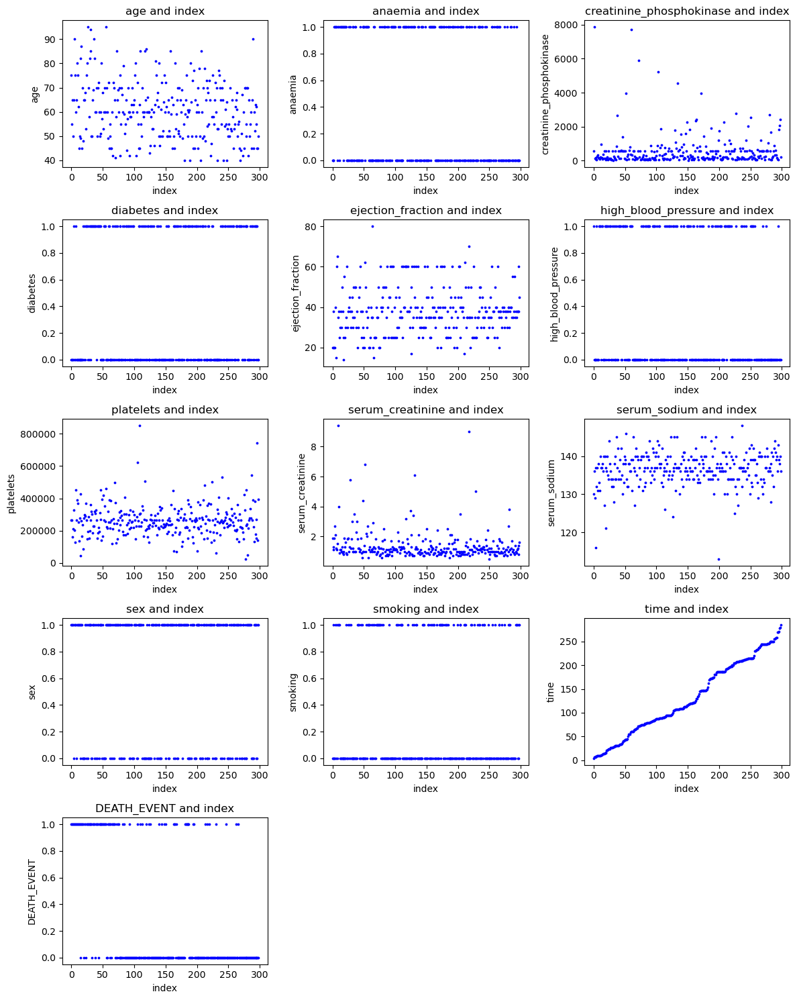

In [7]:
plot_indices_relation(raw_data, (12, 15))

There is a correlation between indices and *time*, which may be explained by the fact that this dataset is sorted by *time* feature.

#### Distribution

In [75]:
print("\nSummary statistics for numerical variables:")
raw_data.describe()


Summary statistics for numerical variables:


,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.836120,0.431438,581.839465,0.418060,38.083612,0.351171,263358.026756,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


We have some small conclusions:
- *creatinine_phosphokinase* may be right-skewed as **mean** and **median** differ. Also there seem to be outliers as the **maximum** is a lot higher than the **mean**,
- *platelets* and *serum_creatinine* definitely have outliers since their **maximum** values are extremaly high,
- There is an imbalance in the target feature (*DEATH_EVENT*), as $32\%$ of people died of heart failure.

In [9]:
skewness(raw_data)

Feature: age 
 skewness = 0.423, right-skewed.
Feature: anaemia 
 skewness = 0.278, right-skewed.
Feature: creatinine_phosphokinase 
 skewness = 4.463, right-skewed.
Feature: diabetes 
 skewness = 0.334, right-skewed.
Feature: ejection_fraction 
 skewness = 0.555, right-skewed.
Feature: high_blood_pressure 
 skewness = 0.627, right-skewed.
Feature: platelets 
 skewness = 1.462, right-skewed.
Feature: serum_creatinine 
 skewness = 4.456, right-skewed.
Feature: serum_sodium 
 skewness = -1.048, left-skewed.
Feature: sex 
 skewness = -0.627, left-skewed.
Feature: smoking 
 skewness = 0.770, right-skewed.
Feature: time 
 skewness = 0.128, right-skewed.
Feature: DEATH_EVENT 
 skewness = 0.770, right-skewed.


As hypothesised *creatinine_phosphokinase* is highly right-skewed, as are *serum_creatinine* and *platelets*. Most of the features have midly right-skewed distribution.

In [10]:
binary_columns = ['anaemia', 'diabetes', 'high_blood_pressure', 'sex', 'smoking', 'DEATH_EVENT']
raw_data_nonbinary = raw_data.drop(binary_columns, axis=1)

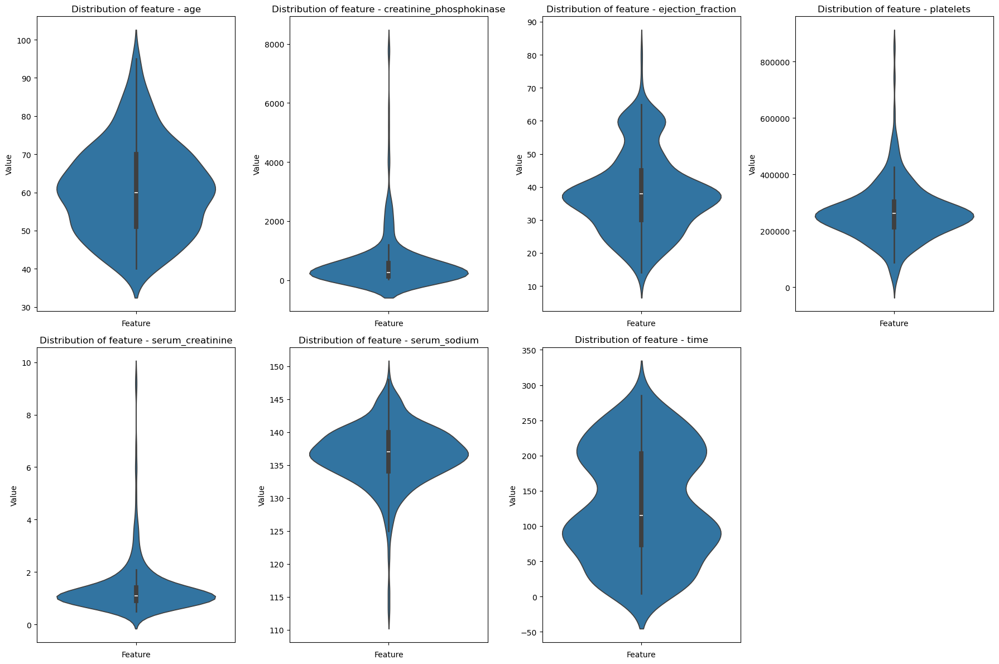

In [11]:
plot_violin_features(raw_data_nonbinary, (18, 12))

Violin plots confirm the existence of outliers in several fetures (they cause longer tails of the distributions).

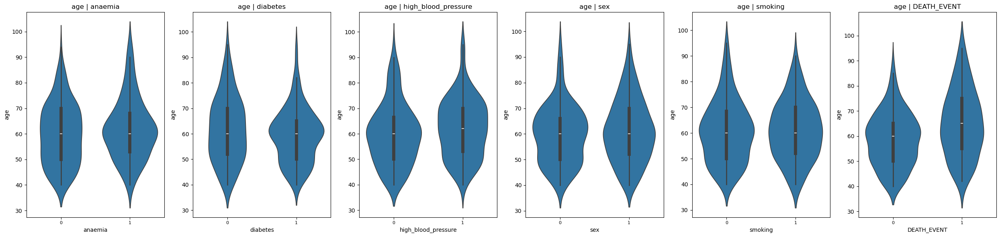

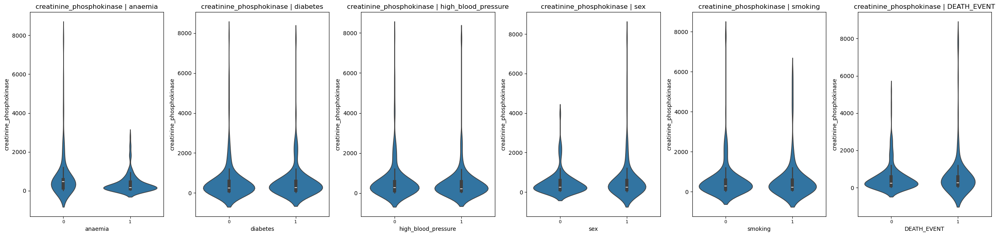

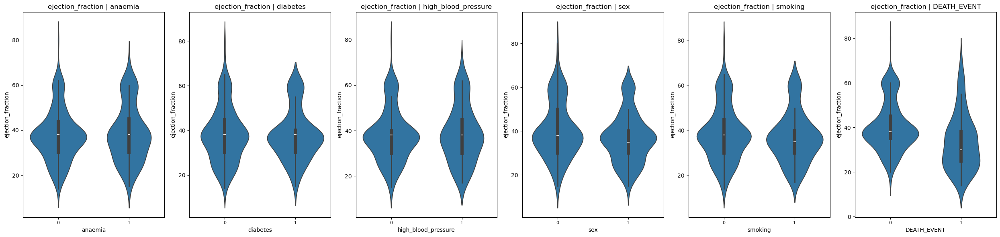

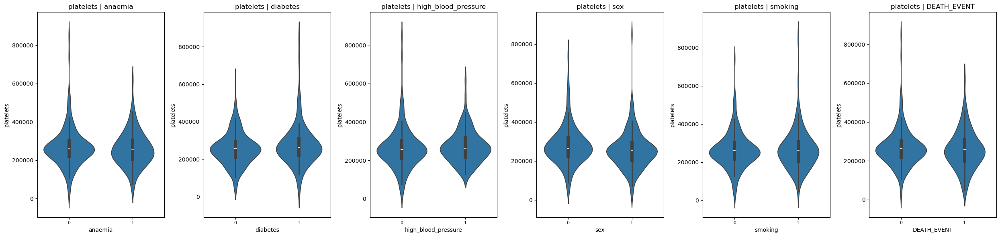

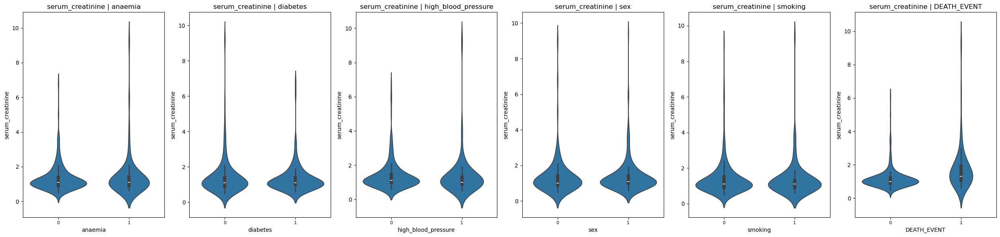

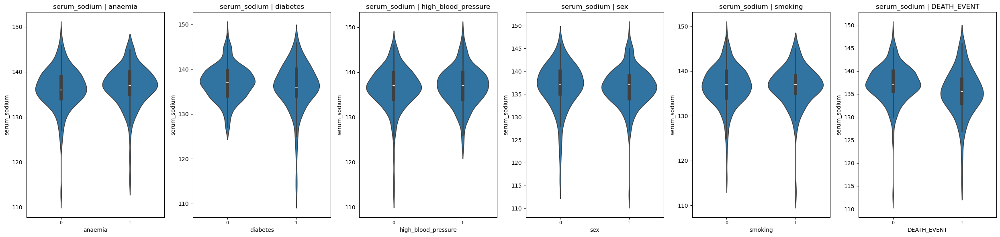

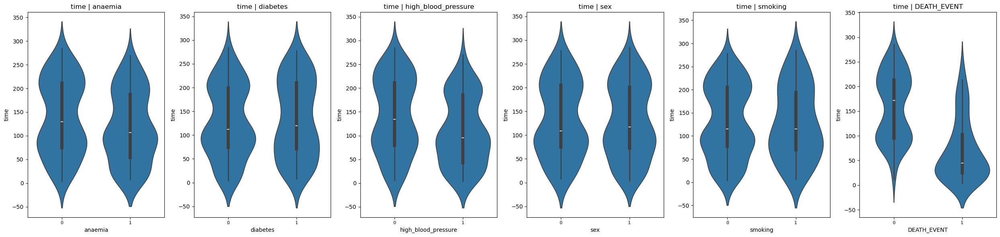

In [12]:
plot_violin_with_binary_hue(raw_data, binary_columns, (25, 6))

After checking violin plots with distinction for different binary features we can draw some conclusions:
- for now features with visible outliers are not informative,
- *time* with respect to *DEATH_EVENT* differ greatly in **mean** and distribution,
- *ejection_fraction* with respect to *DEATH_EVENT* differ visibly in **mean**.

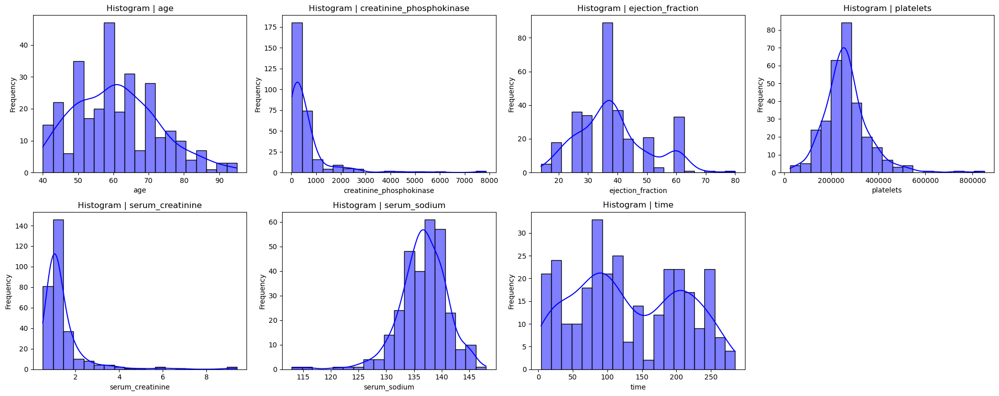

In [13]:
plot_histograms_nonbinary(raw_data_nonbinary, (20, 8))

We can suspect some normality of the data, except for *time* which seems uniformly distributed.

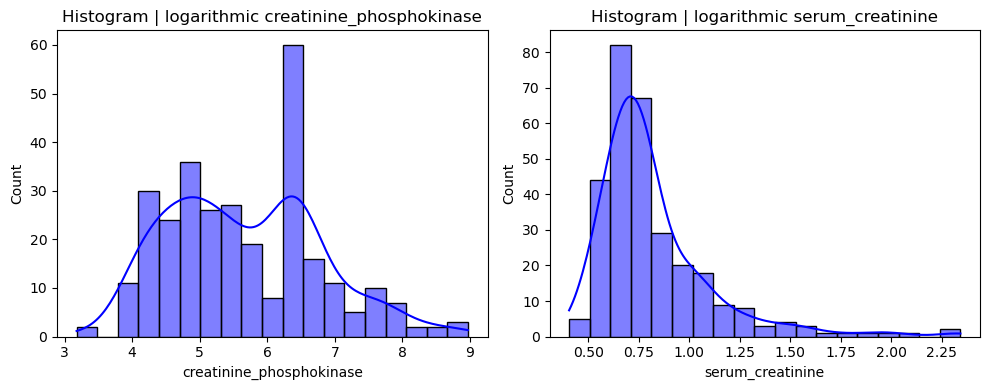

In [14]:
plot_histograms_nonbinary_logarithmic(raw_data_nonbinary, ['creatinine_phosphokinase', 'serum_creatinine'], (10, 4))

We used the function $\log (1+x)$ on *creatinine_phosphokinase* and *serum_creatinine* so see whether the outliers break normality of those features. We can conlude that *creatinine_phosphokinase* is definitely not normally distributed.

In [15]:
for key, value in unique_column_content_check(raw_data_nonbinary).items():
    print(f'Column name: {key}\nUnique values:\n{value[0]}\nTotal unique values:{value[1]}\n\n')


Column name: age
Unique values:
[40.    41.    42.    43.    44.    45.    46.    47.    48.    49.
 50.    51.    52.    53.    54.    55.    56.    57.    58.    59.
 60.    60.667 61.    62.    63.    64.    65.    66.    67.    68.
 69.    70.    72.    73.    75.    77.    78.    79.    80.    81.
 82.    85.    86.    87.    90.    94.    95.   ]
Total unique values:47


Column name: creatinine_phosphokinase
Unique values:
[  23   30   47   52   53   54   55   56   57   58   59   60   61   62
   63   64   66   68   69   70   72   75   76   78   80   81   84   86
   88   90   91   92   93   94   95   96   97   99  101  102  103  104
  109  110  111  112  113  115  118  119  121  122  123  124  125  127
  128  129  130  131  132  133  135  143  144  145  146  148  149  151
  154  156  157  159  160  161  166  167  168  170  171  176  180  185
  190  191  193  196  198  200  203  207  211  212  213  220  224  231
  232  233  235  244  245  246  248  249  250  253  257  258  260  270

We found a reason for why *platelets* and *age* are a float type - we can safely round the values to then change this feature to int.

Also we can clearly read and find the outliers of previously mentioned features.

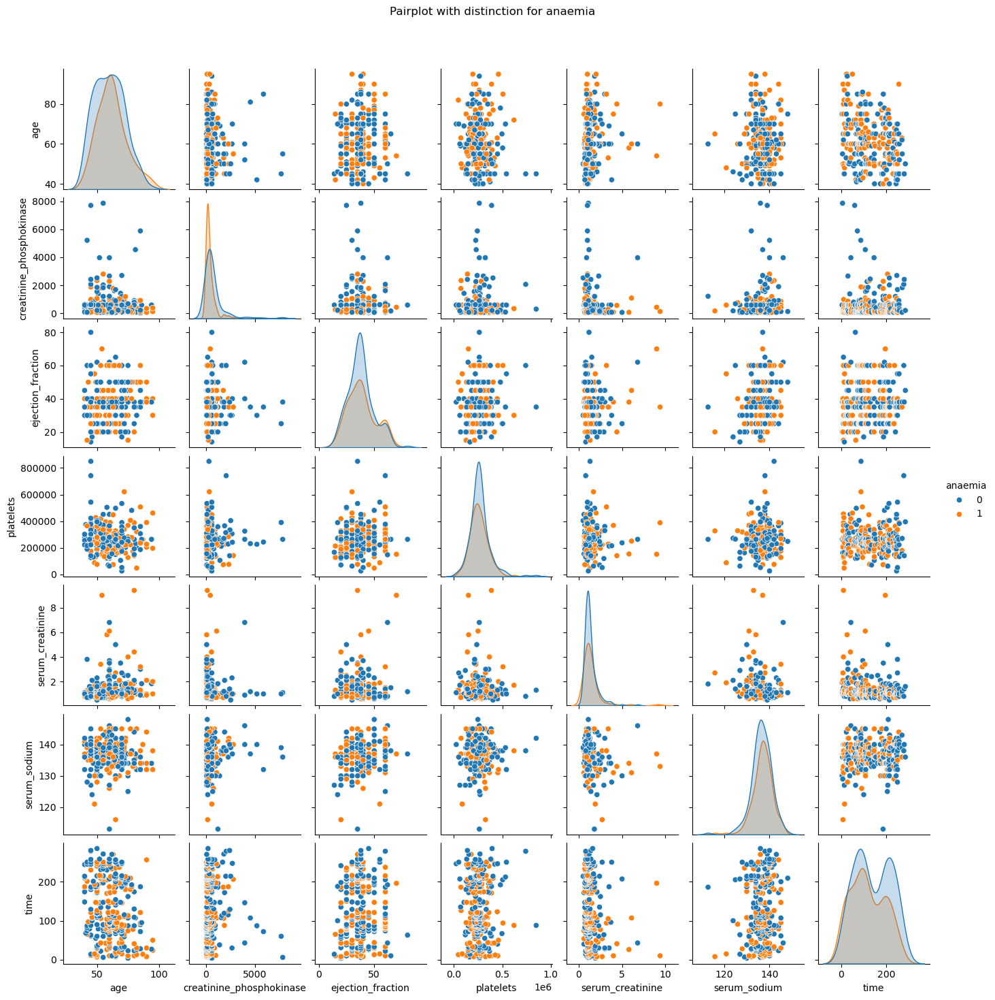

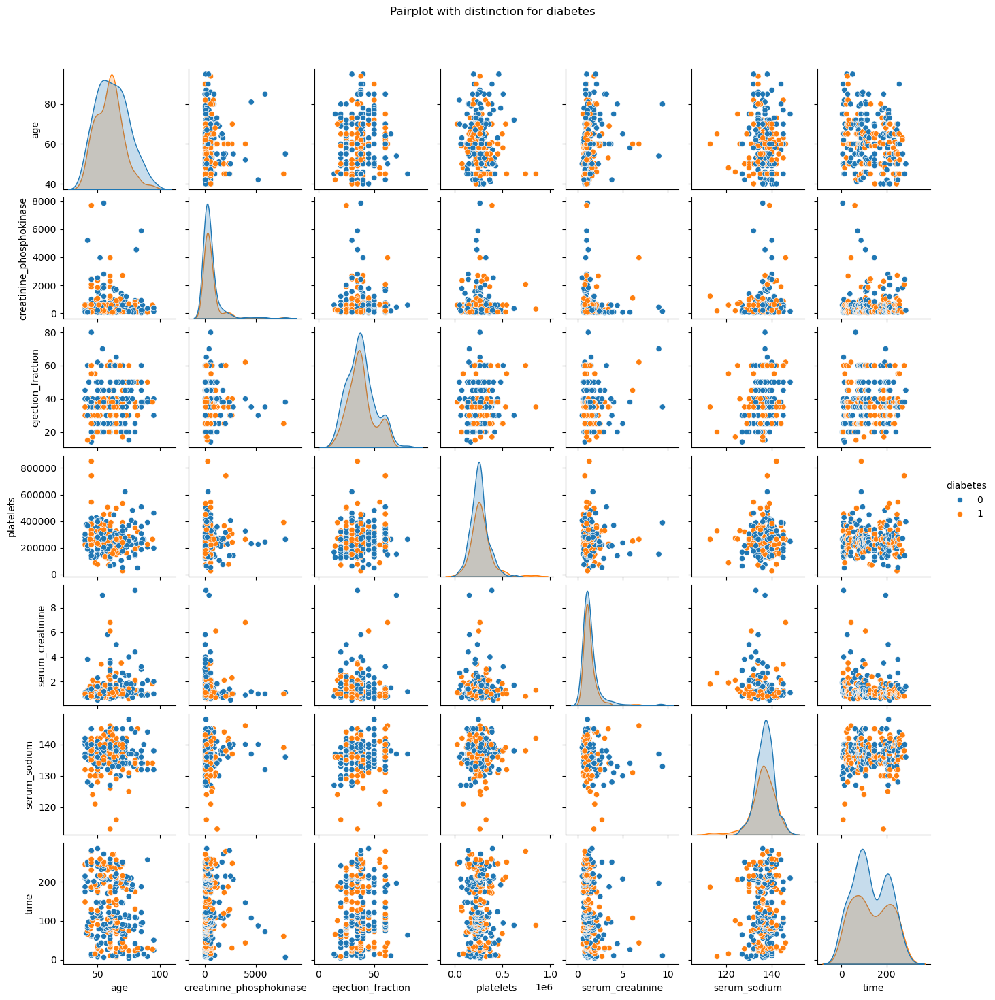

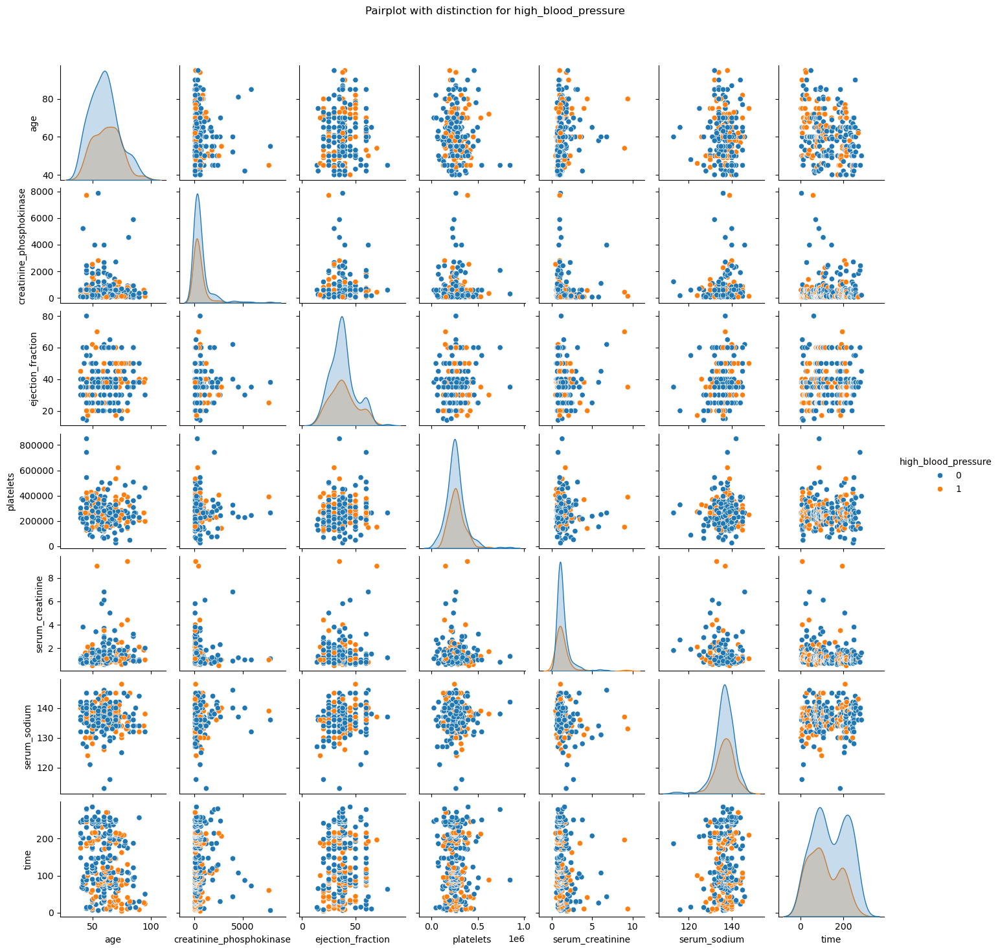

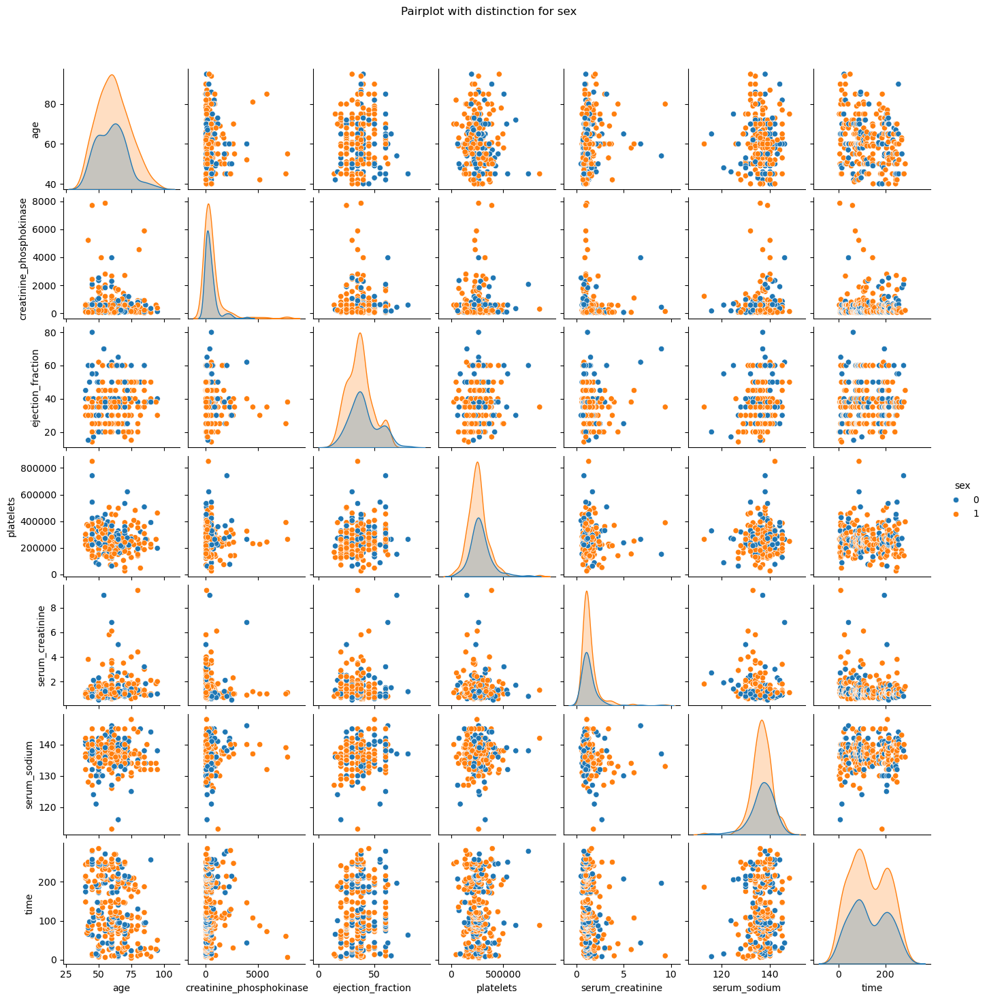

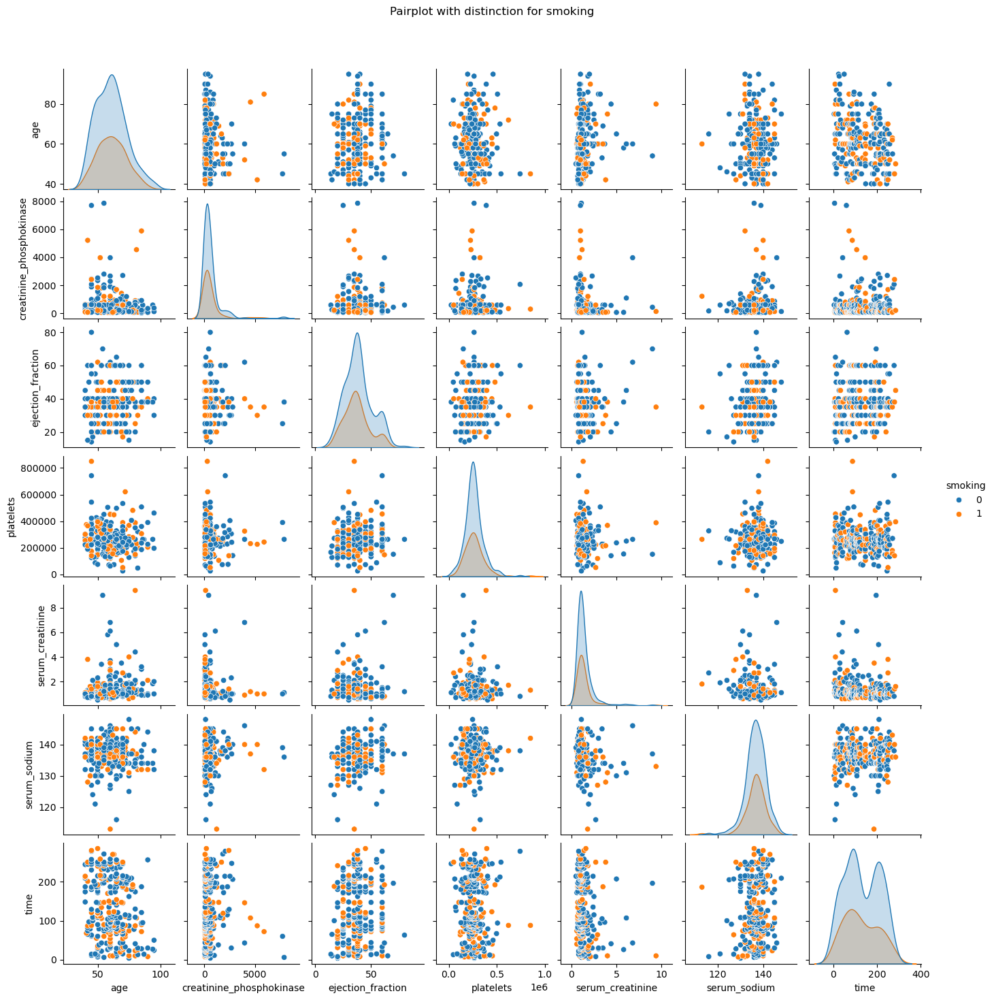

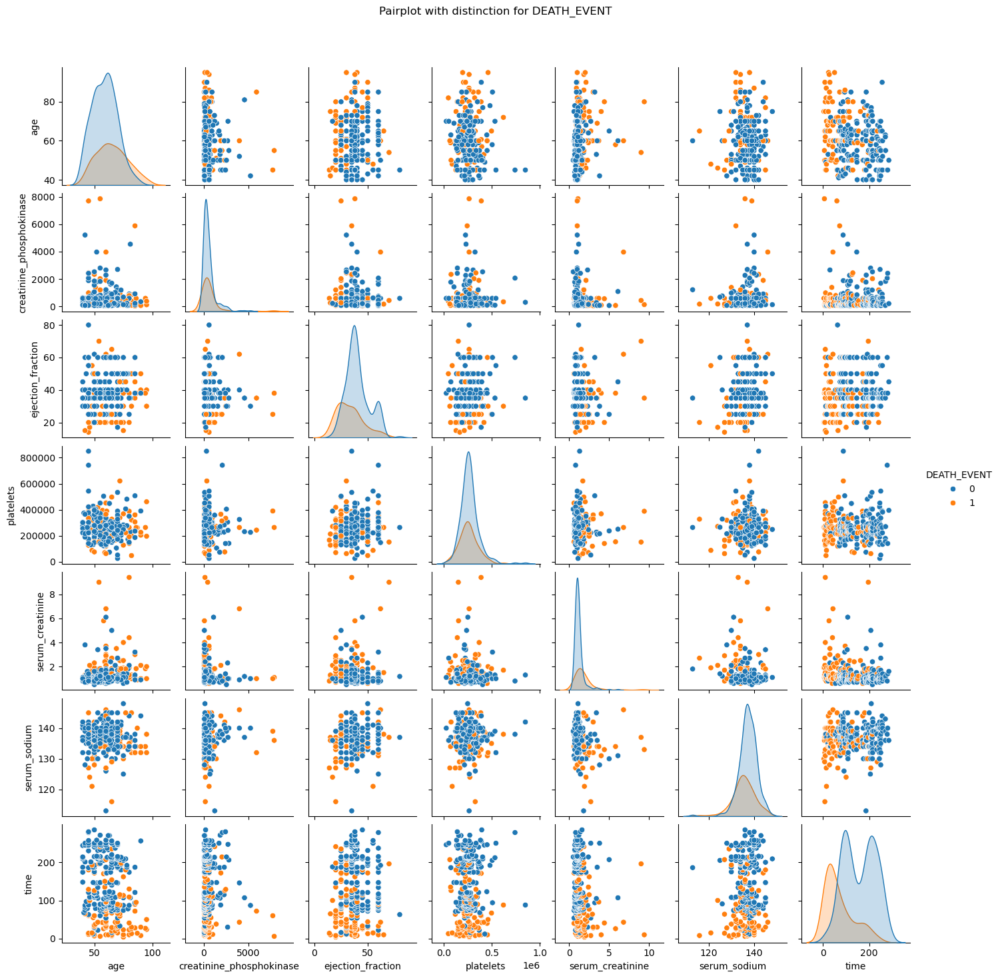

In [16]:
plot_pairplots_kde_hue(raw_data, binary_columns)

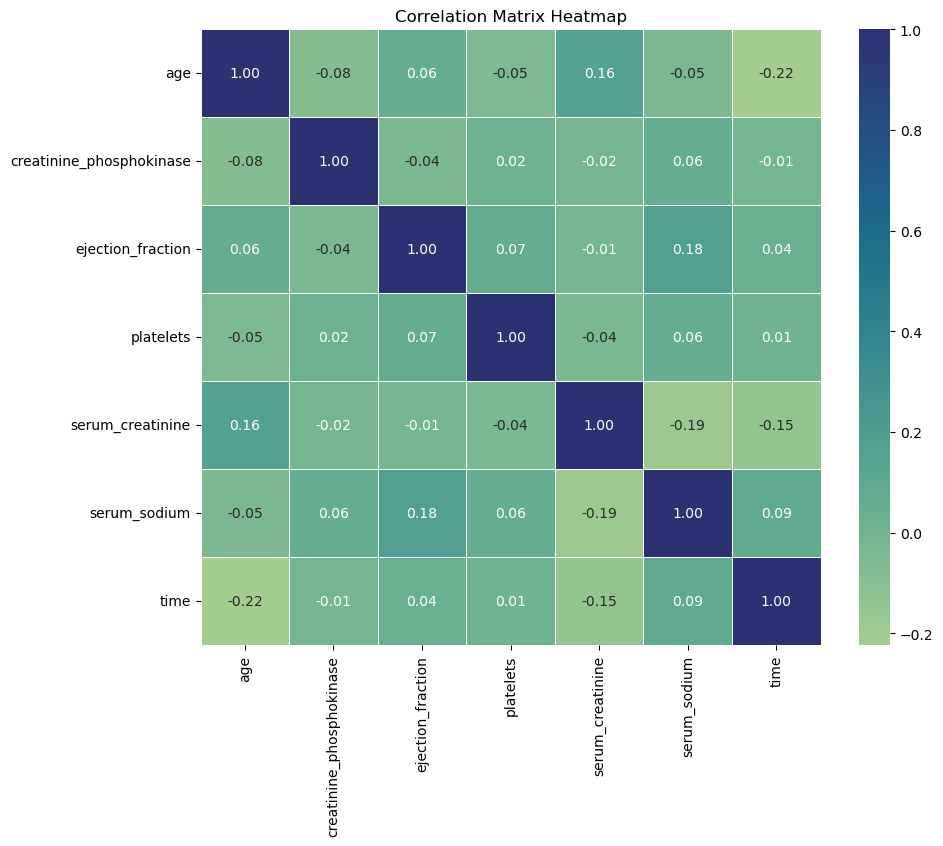

In [17]:
correlation_matrix = raw_data_nonbinary.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, linewidth=.5, fmt='.2f', cmap='crest')
plt.title('Correlation Matrix Heatmap')
plt.show()

In [18]:
corr_matrix_dataframe(raw_data_nonbinary)

correlation
time                     age                          0.224068
serum_sodium             serum_creatinine             0.189095
                         ejection_fraction            0.175902
serum_creatinine         age                          0.159187
time                     serum_creatinine             0.149315
                         serum_sodium                 0.087640
creatinine_phosphokinase age                          0.081584
platelets                ejection_fraction            0.072177
serum_sodium             platelets                    0.062125
ejection_fraction        age                          0.060098
serum_sodium             creatinine_phosphokinase     0.059550
platelets                age                          0.052354
serum_sodium             age                          0.045966
ejection_fraction        creatinine_phosphokinase     0.044080
time                     ejection_fraction            0.041729
serum_creatinine         platelets                    0.041198
platelets                creatinine_phosphokinase     0.024463
serum_creatinine         creatinine_phosphokinase     0.016408
                         ejection_fraction            0.011302
time                     platelets                    0.010514
                         creatinine_phosphokinase     0.009346

We can't find any correlation between features that would be of our interest.

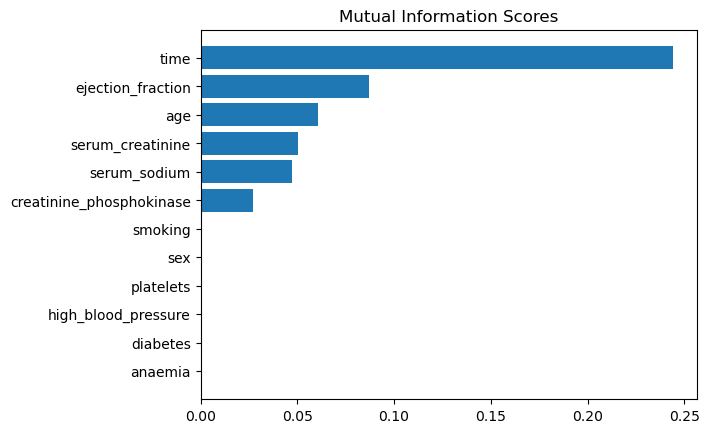

<Figure size 800x500 with 0 Axes>

In [19]:
mi_scores = make_mi_scores(raw_data.drop('DEATH_EVENT', axis=1), raw_data['DEATH_EVENT'])

plot_mi_scores(mi_scores)

We find that before cleaning features above *creatinine_phosphokinase* have some significance with respect to *DEATH_EVENT*. 

*time* is greatly in the lead.

#### Class label distribution
This dataset is **imbalanced** with almost $2\times$ samples labeled $0$.

Class=1, n=96 (32.107%)
Class=0, n=203 (67.893%)


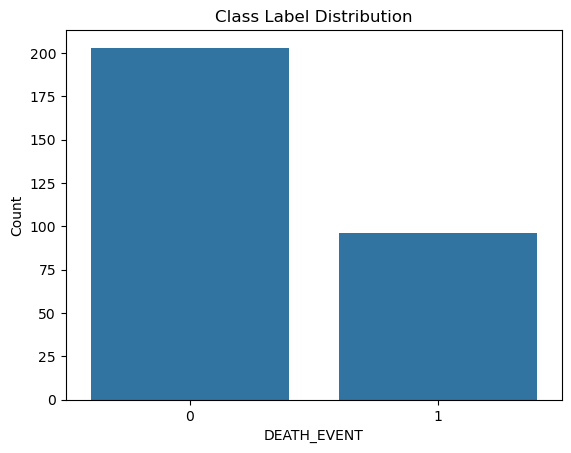

In [20]:
plot_class_distribution(raw_data['DEATH_EVENT'], 'DEATH_EVENT')

We can see the confirmation of the fact that the data is imbalanced for our target.

___
# ***Cleaning***
___

In [21]:
raw_data['age'] = raw_data['age'].round().astype('int64')
raw_data['platelets'] = raw_data['platelets'].round().astype('int64')

In [22]:
raw_data.dtypes


age                           int64
anaemia                       int64
creatinine_phosphokinase      int64
diabetes                      int64
ejection_fraction             int64
high_blood_pressure           int64
platelets                     int64
serum_creatinine            float64
serum_sodium                  int64
sex                           int64
smoking                       int64
time                          int64
DEATH_EVENT                   int64
dtype: object

We changed the *age* and *platelets* to int.

In [23]:
data_cleaning = make_pipeline(
    FunctionTransformer(lambda X: X.drop_duplicates(), validate=False),
    CustomOutlierRemoverInterquartile(factor=2.5),
)
df_cleaned = data_cleaning.fit_transform(raw_data)
df_cleaned.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75,0,582,0,20,1,265000,1.9,130,1,0,4,1
2,65,0,146,0,20,0,162000,1.3,129,1,1,7,1
3,50,1,111,0,20,0,210000,1.9,137,1,0,7,1
5,90,1,47,0,40,1,204000,2.1,132,1,1,8,1
6,75,1,246,0,15,0,127000,1.2,137,1,0,10,1


We created a custom pipeline, which removes the duplicates, and gets rid of the outliers based on IQR, because most of the distributions were not normal, so using z-score would not be beneficial.

___
# ***EDA*** - after cleaning
___

### *basic* ***EDA***

In [24]:
df_cleaned.shape

(251, 13)

Number dropped from $299\to 251$ after cleaning.

In [25]:
df_cleaned.dtypes

age                           int64
anaemia                       int64
creatinine_phosphokinase      int64
diabetes                      int64
ejection_fraction             int64
high_blood_pressure           int64
platelets                     int64
serum_creatinine            float64
serum_sodium                  int64
sex                           int64
smoking                       int64
time                          int64
DEATH_EVENT                   int64
dtype: object

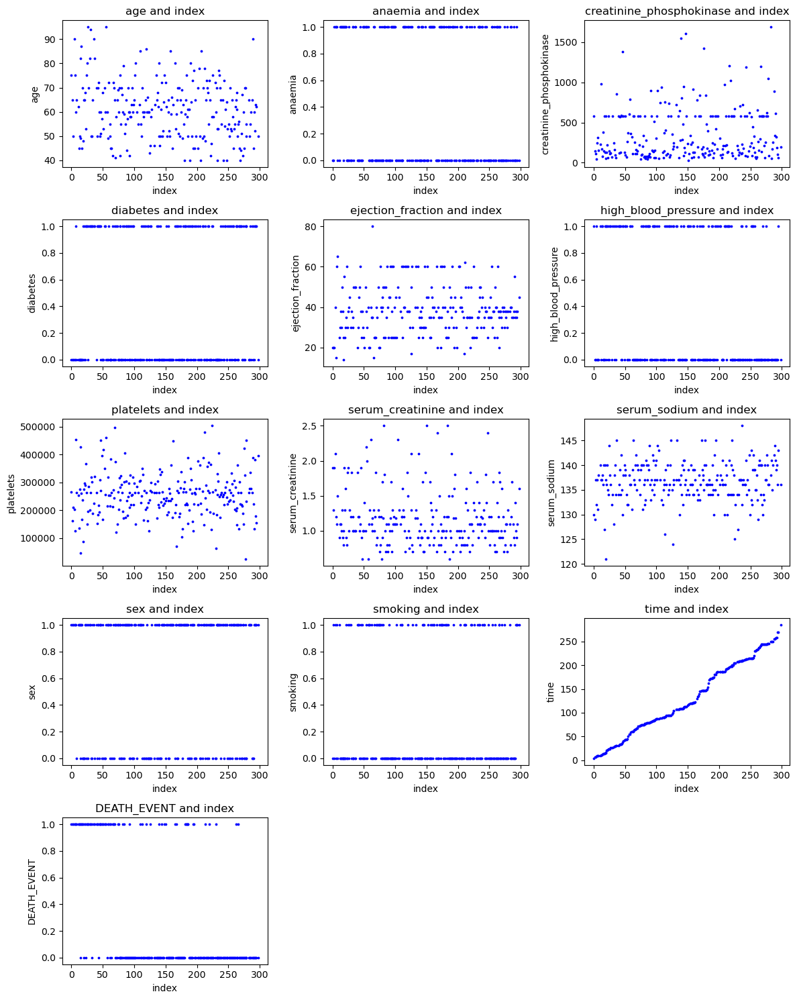

In [26]:
plot_indices_relation(df_cleaned, (12, 15))

In [27]:
print("\nSummary statistics:")
df_cleaned.describe()


Summary statistics:


,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000
mean,60.980080,0.446215,357.290837,0.418327,38.254980,0.370518,257516.406375,1.179721,136.741036,0.641434,0.314741,130.844622,0.302789
std,11.879546,0.498092,318.577098,0.494270,11.981599,0.483908,80011.538715,0.399340,4.011068,0.480538,0.465341,76.569993,0.460383
min,40.000000,0.000000,30.000000,0.000000,14.000000,0.000000,25100.000000,0.600000,121.000000,0.000000,0.000000,4.000000,0.000000
25%,51.000000,0.000000,115.000000,0.000000,30.000000,0.000000,210000.000000,0.900000,134.000000,0.000000,0.000000,74.000000,0.000000
50%,60.000000,0.000000,224.000000,0.000000,38.000000,0.000000,262000.000000,1.100000,137.000000,1.000000,0.000000,117.000000,0.000000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,299000.000000,1.300000,140.000000,1.000000,1.000000,203.000000,1.000000
max,95.000000,1.000000,1688.000000,1.000000,80.000000,1.000000,504000.000000,2.500000,148.000000,1.000000,1.000000,285.000000,1.000000


We can see we got rid of previously prominent outliers.

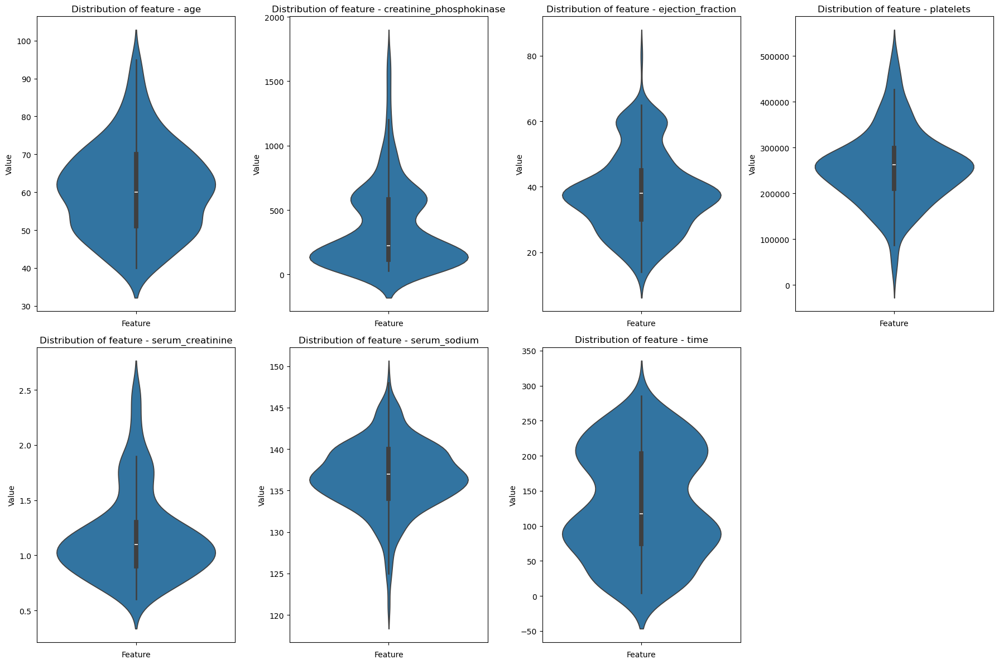

In [28]:
warnings.filterwarnings(action='ignore')
df_cleaned_nonbinary = df_cleaned.drop(binary_columns, axis=1)

plot_violin_features(df_cleaned_nonbinary, (18, 12))

We can see the tails got smaller, but without loss of so much high/low valued data.

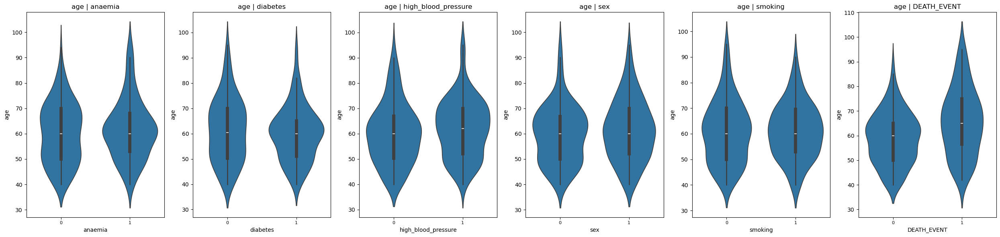

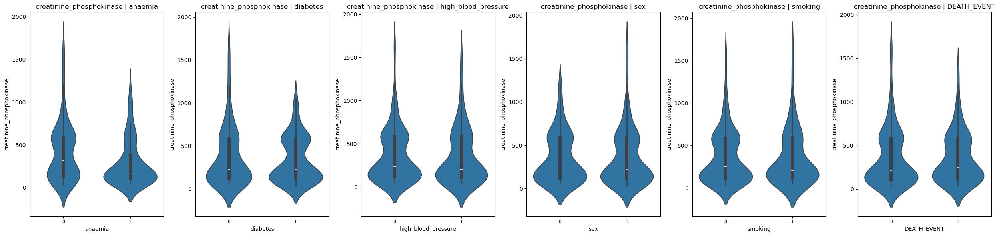

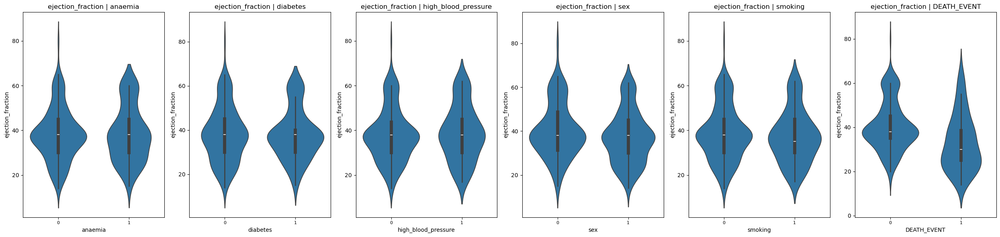

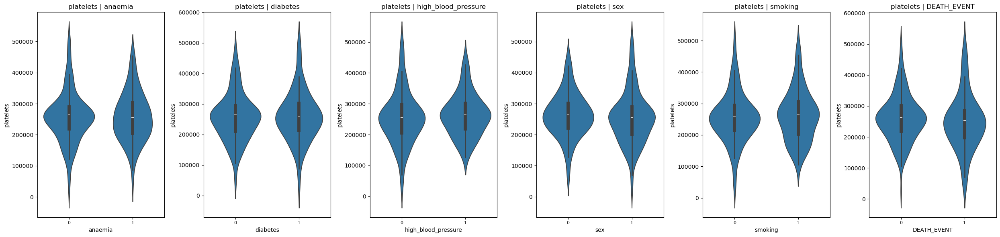

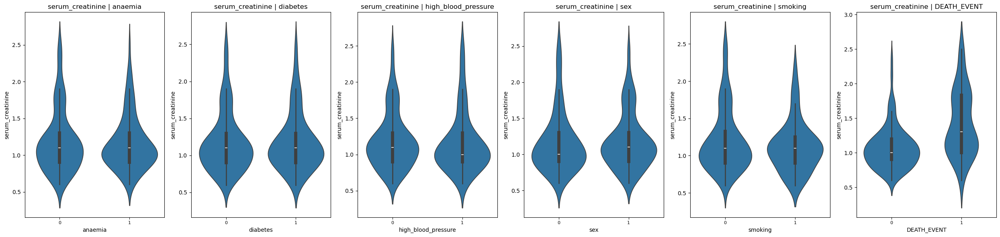

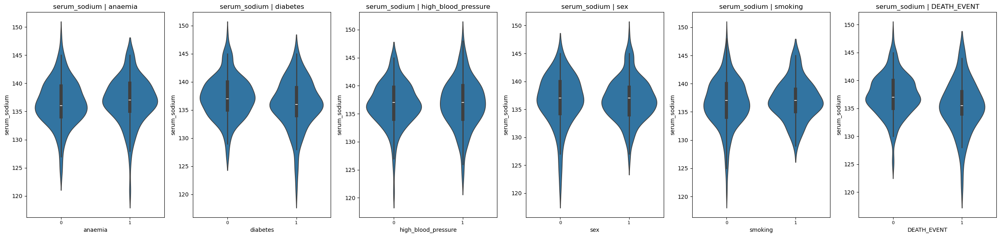

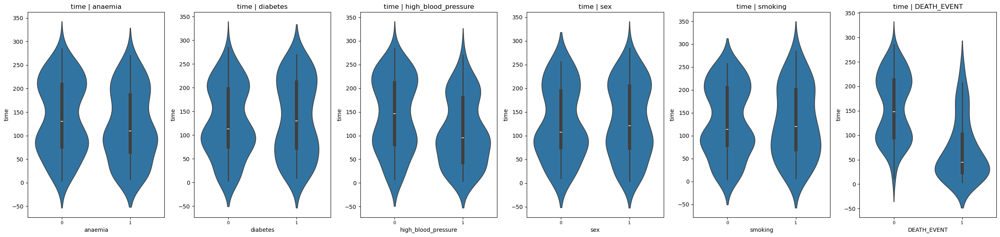

In [29]:
warnings.filterwarnings(action='ignore')
plot_violin_with_binary_hue(df_cleaned, binary_columns, (25, 6))

(*time* $\lor$ *serum_creatinine* $\lor$ *age*) with respect to *DEATH_EVENT* has significant difference in **mean**.

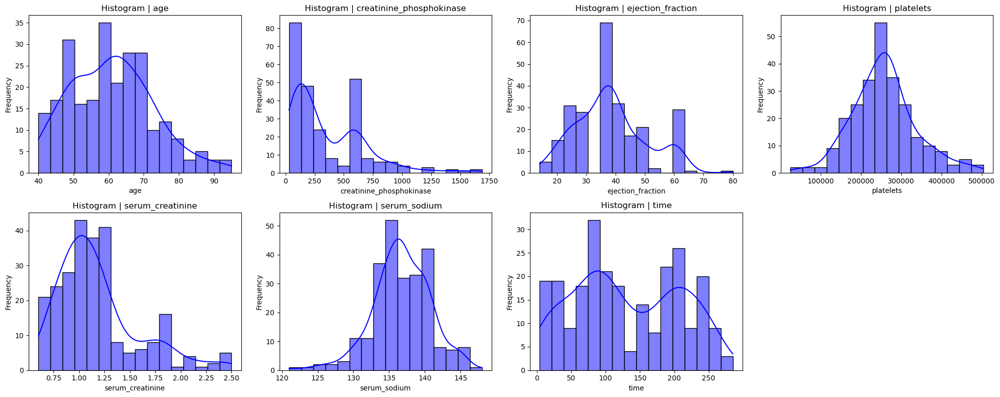

In [30]:
plot_histograms_nonbinary(df_cleaned_nonbinary, (20, 8))

Our previous hypotheses about normality of the features are to be probably rejected.

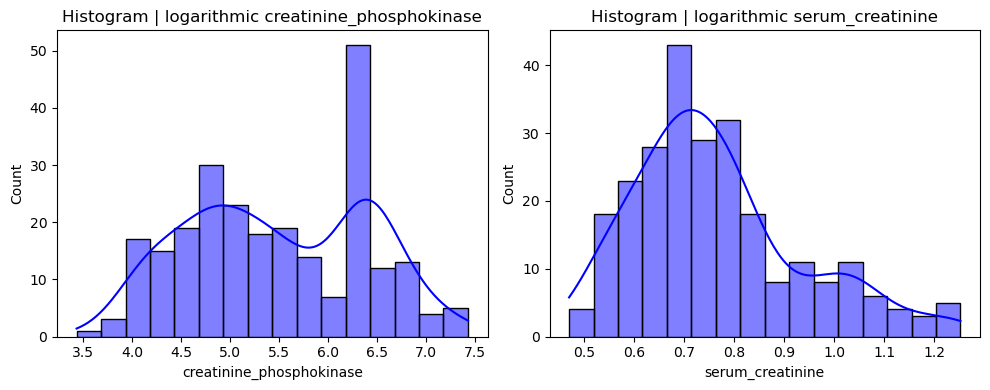

In [31]:
plot_histograms_nonbinary_logarithmic(df_cleaned_nonbinary, ['creatinine_phosphokinase', 'serum_creatinine'], (10, 4))

Again we used $\log (1+x)$ to see some results, but it did not give us anything significant.

In [32]:
for key, value in unique_column_content_check(df_cleaned_nonbinary).items():
    print(f'Column name: {key}\nUnique values:\n{value[0]}\nTotal unique values:{value[1]}\n\n')

Column name: age
Unique values:
[40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63
 64 65 66 67 68 69 70 72 73 75 77 78 79 80 82 85 86 87 90 94 95]
Total unique values:45


Column name: creatinine_phosphokinase
Unique values:
[  30   47   52   53   54   55   56   57   58   59   60   61   62   63
   64   66   68   69   70   72   76   78   80   84   86   88   90   91
   92   93   94   95   96   97   99  101  102  103  104  109  110  111
  112  113  115  118  119  121  122  124  125  127  128  129  130  131
  132  133  135  143  144  145  146  148  149  151  154  156  157  159
  161  166  167  168  170  171  176  180  185  190  191  193  196  198
  200  203  207  211  212  213  220  224  231  232  233  244  245  246
  248  249  250  253  257  258  260  280  281  291  298  305  308  315
  318  320  326  335  336  337  358  364  369  371  379  395  400  418
  446  478  482  514  571  572  577  582  588  607  615  618  624  646
  655  675  707  719  720  737  748  754  

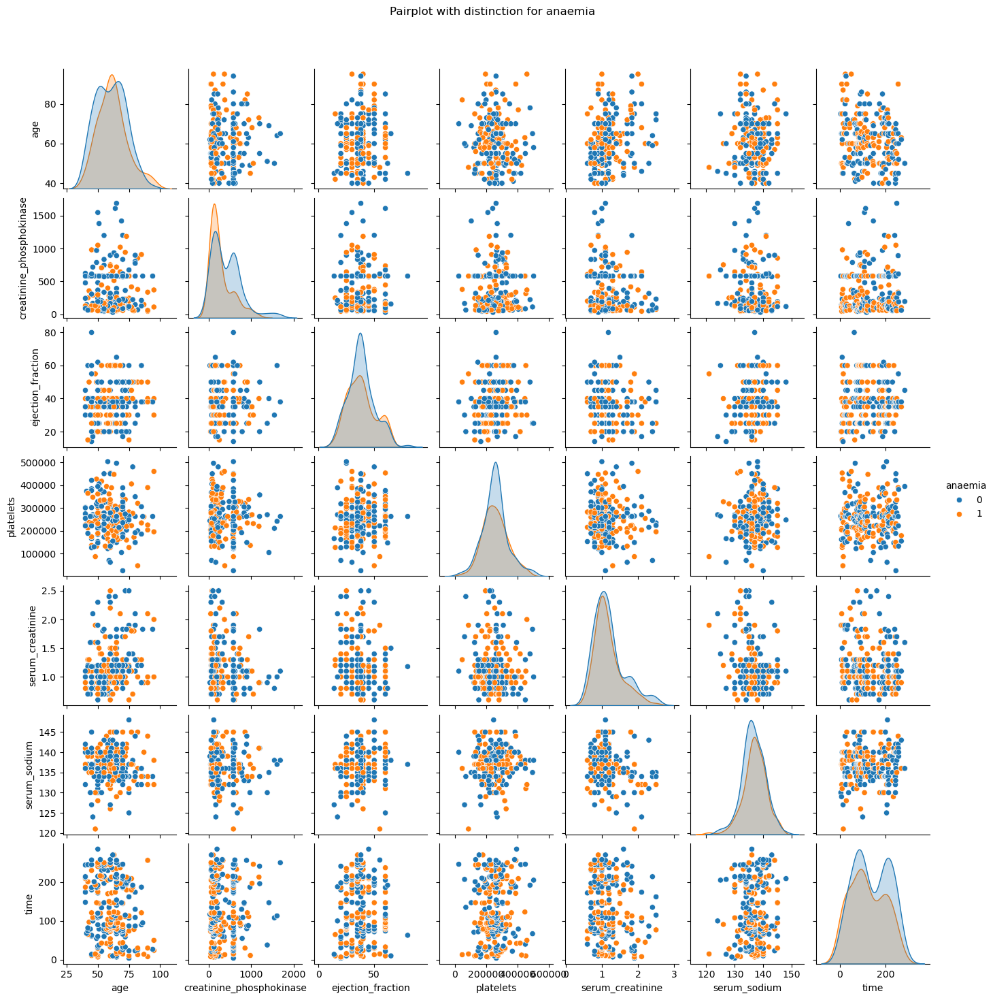

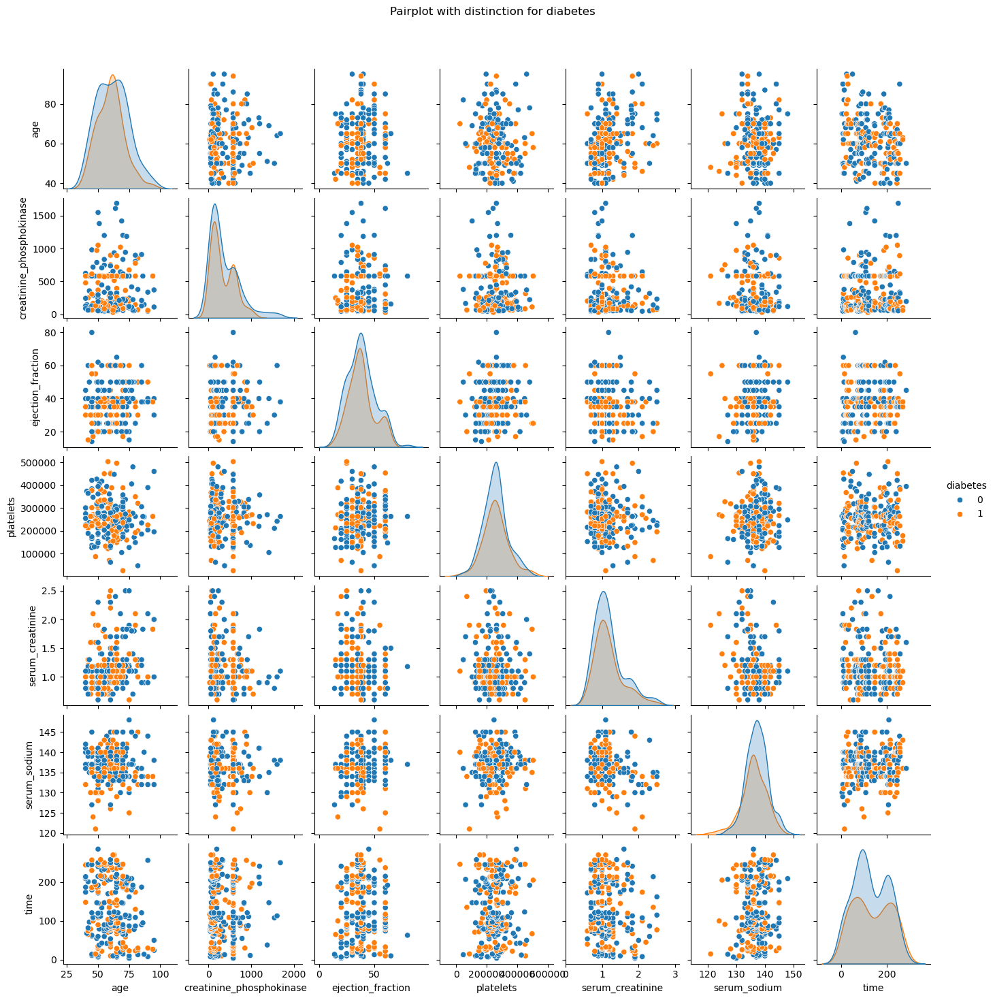

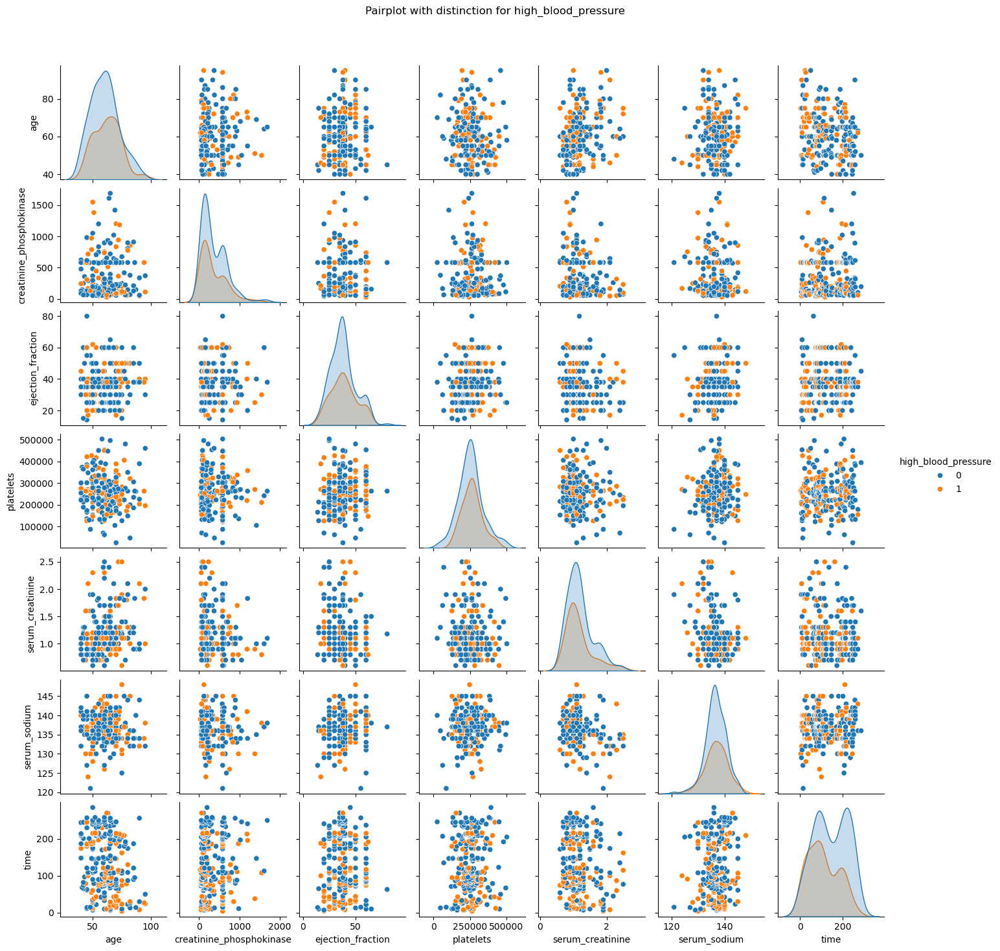

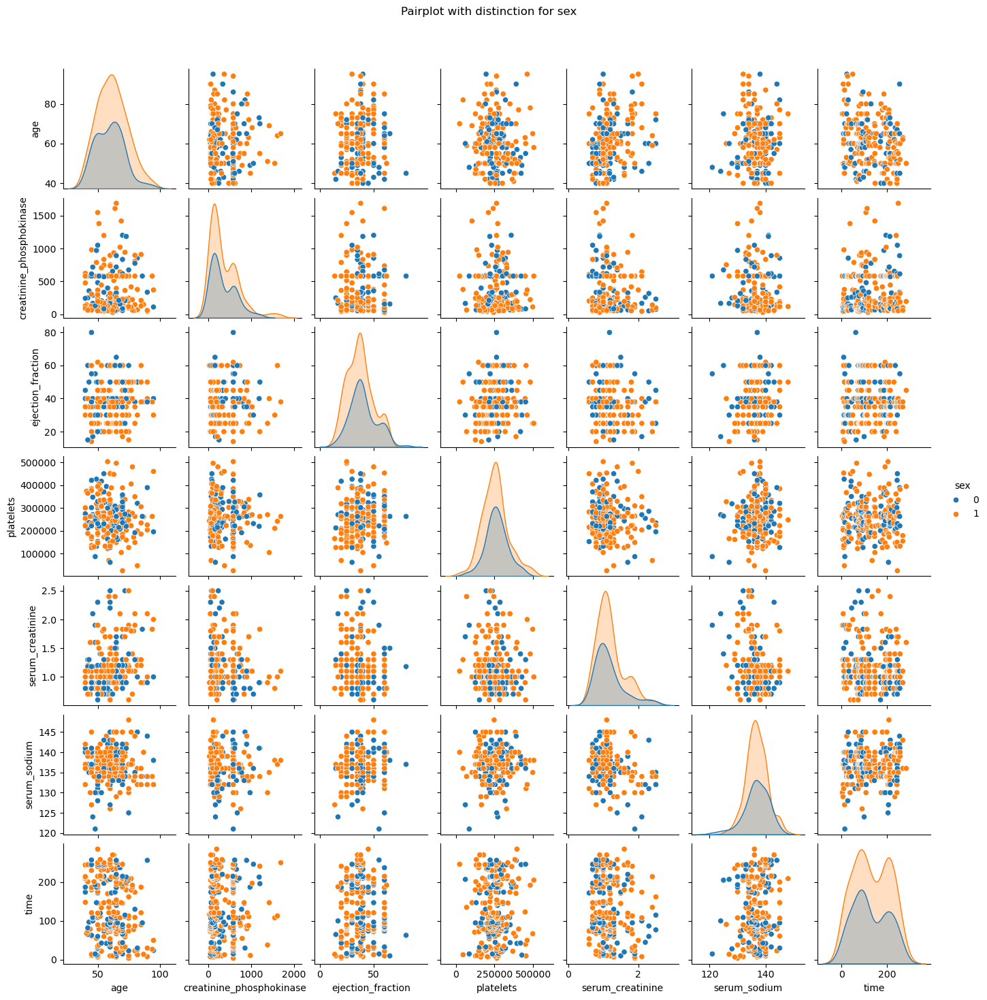

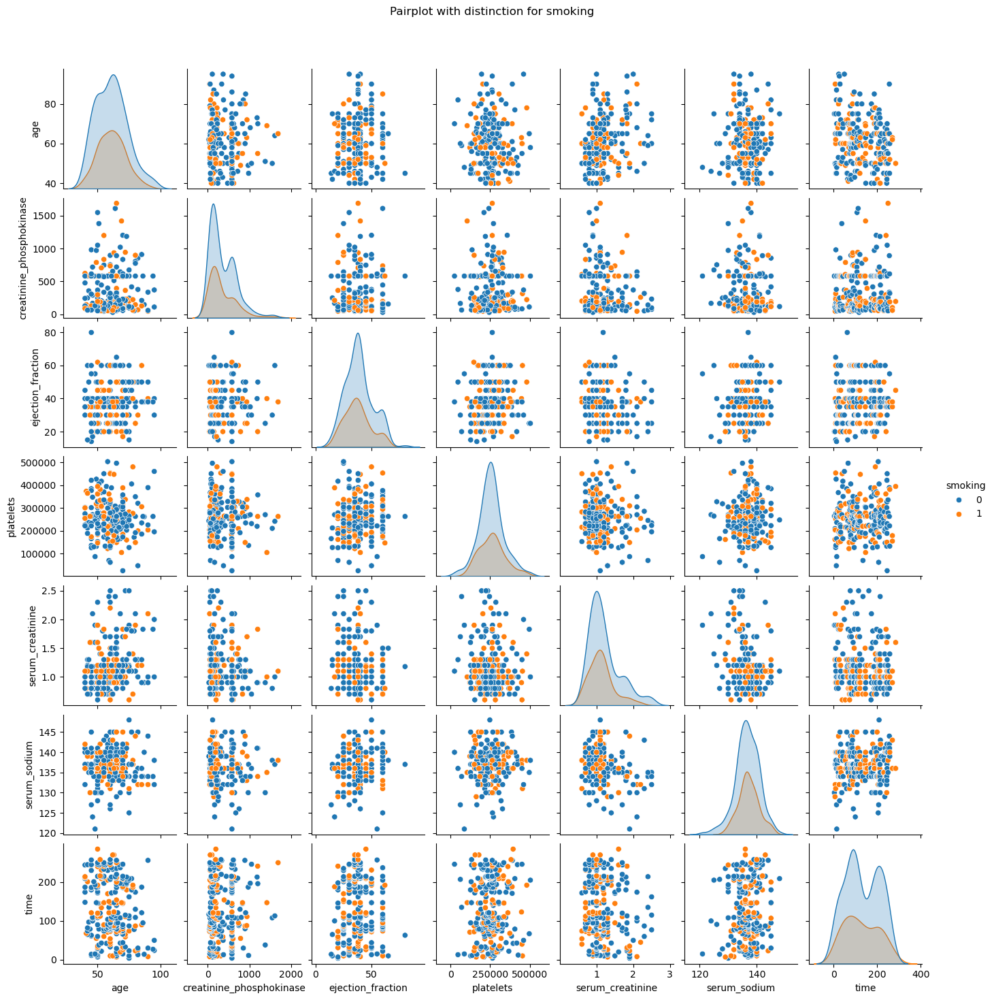

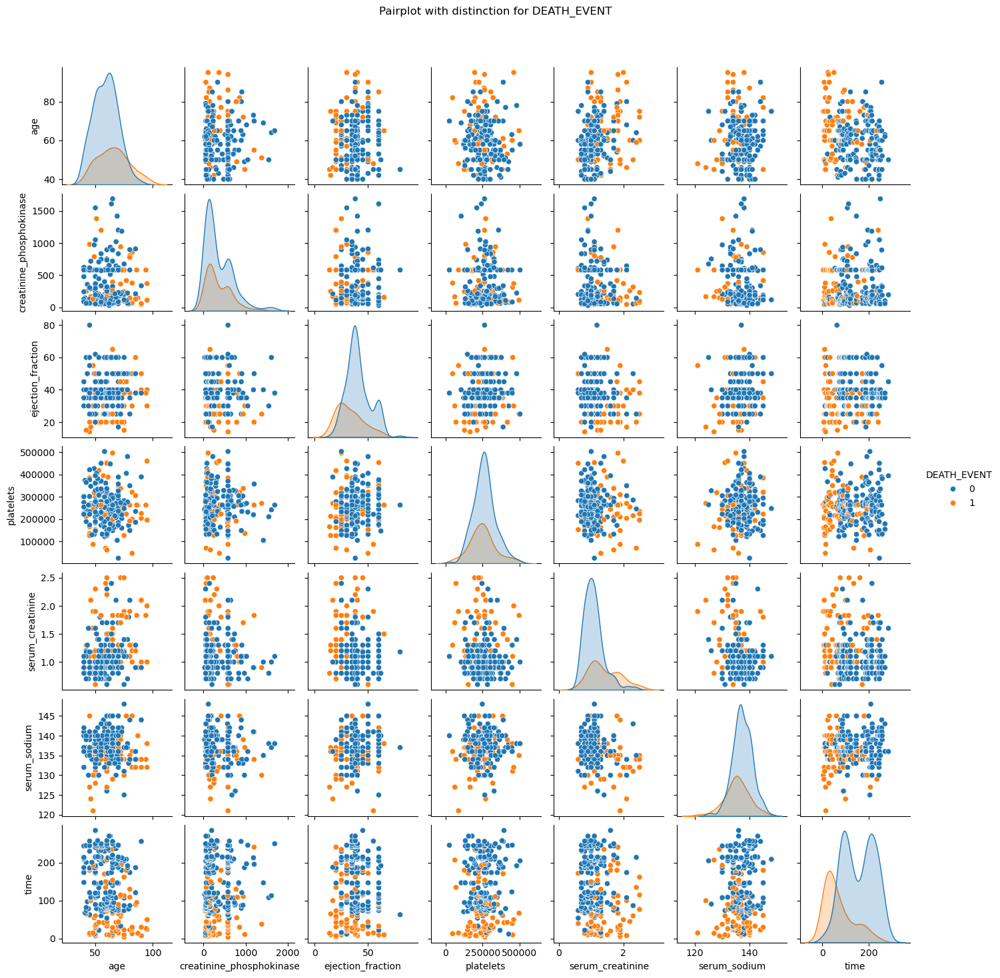

In [33]:
plot_pairplots_kde_hue(df_cleaned, binary_columns)

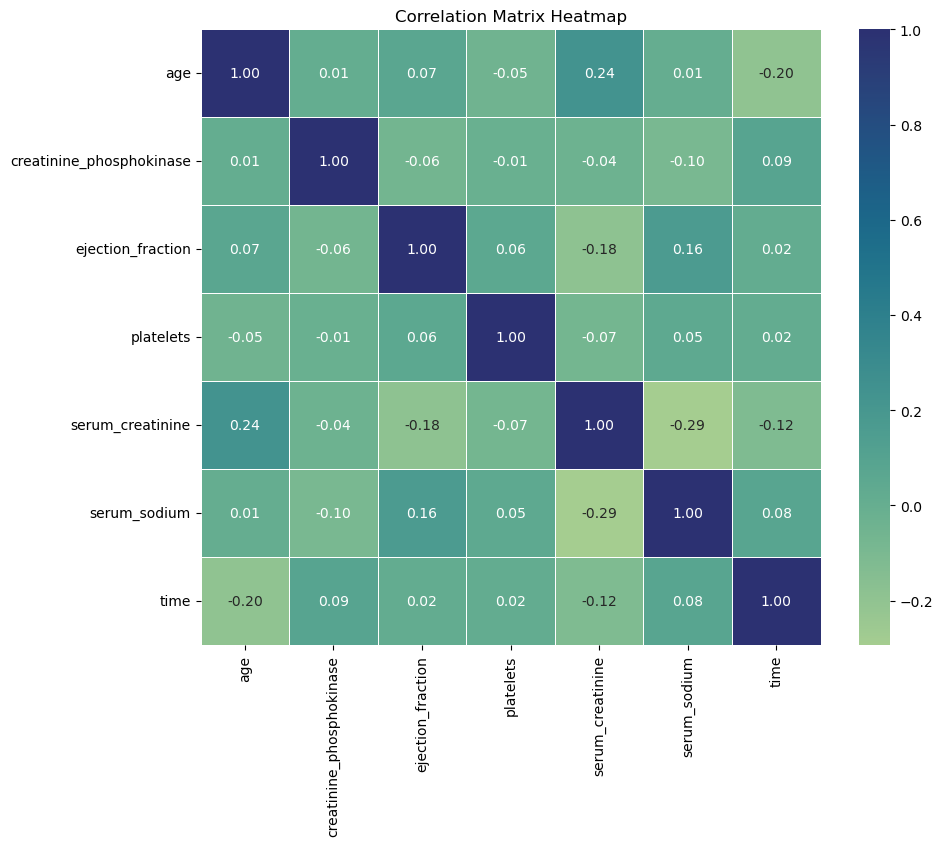

In [34]:
correlation_matrix = df_cleaned_nonbinary.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, linewidth=.5, fmt='.2f', cmap='crest')
plt.title('Correlation Matrix Heatmap')
plt.show()

In [35]:
corr_matrix_dataframe(df_cleaned_nonbinary)

correlation
serum_sodium             serum_creatinine             0.294318
serum_creatinine         age                          0.235936
time                     age                          0.195629
serum_creatinine         ejection_fraction            0.184765
serum_sodium             ejection_fraction            0.164013
time                     serum_creatinine             0.118357
serum_sodium             creatinine_phosphokinase     0.095236
time                     creatinine_phosphokinase     0.090964
                         serum_sodium                 0.081411
ejection_fraction        age                          0.073074
serum_creatinine         platelets                    0.070739
ejection_fraction        creatinine_phosphokinase     0.063602
platelets                ejection_fraction            0.058940
serum_sodium             platelets                    0.048842
platelets                age                          0.048481
serum_creatinine         creatinine_phosphokinase     0.035400
time                     ejection_fraction            0.017562
                         platelets                    0.016320
platelets                creatinine_phosphokinase     0.012198
creatinine_phosphokinase age                          0.010981
serum_sodium             age                          0.005348

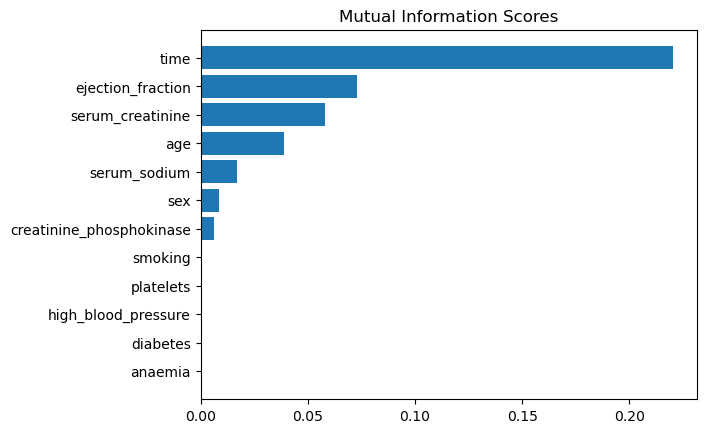

<Figure size 800x500 with 0 Axes>

In [36]:
mi_scores = make_mi_scores(df_cleaned.drop('DEATH_EVENT', axis=1), df_cleaned['DEATH_EVENT'])

plot_mi_scores(mi_scores)

We do not see prominent change in ***MI*** scores.

Now only features above *sex* are of any significance.

### ***EDA*** - statistical tests (for significance level $\alpha = 0.05$)

In [37]:
binary_permutations = list(itertools.combinations(binary_columns, 2))
chi2_independency_array = []

summed_table = df_cleaned.shape[0]
for columns in binary_permutations:
    cross_table = pd.crosstab(df_cleaned[columns[0]], df_cleaned[columns[1]], rownames=[columns[0]], colnames=[columns[1]])
    chi2, p, dof, expected = stats.chi2_contingency(cross_table)
    if p <= 0.05:
        phi_coefficient = np.sqrt(chi2 / summed_table)
    else:
        phi_coefficient = np.nan

    chi2_independency_array.append([columns[0], columns[1], round(p, 4), phi_coefficient])

chi2_independency_df = pd.DataFrame(data=chi2_independency_array, columns=['binary_1', 'binary_2', 'chi2_p_value', 'phi_coefficient'])

chi2_independency_df.sort_values(by='chi2_p_value', ascending=False)

,binary_1,binary_2,chi2_p_value,phi_coefficient
0,anaemia,diabetes,1.0000,NaN
1,anaemia,high_blood_pressure,1.0000,NaN
8,diabetes,DEATH_EVENT,1.0000,NaN
13,sex,DEATH_EVENT,1.0000,NaN
14,smoking,DEATH_EVENT,0.8639,NaN
5,diabetes,high_blood_pressure,0.6725,NaN
4,anaemia,DEATH_EVENT,0.3215,NaN
10,high_blood_pressure,smoking,0.2886,NaN
11,high_blood_pressure,DEATH_EVENT,0.2169,NaN
2,anaemia,sex,0.1574,NaN


In [38]:
chi2_independency_df[chi2_independency_df['chi2_p_value'] <= 0.05].sort_values(by='chi2_p_value', ascending=False)

,binary_1,binary_2,chi2_p_value,phi_coefficient
6,diabetes,sex,0.0362,0.132212
12,sex,smoking,0.0000,0.444100


After performing $\chi^2$ independence test of binary data, we concluded that *diabetes* and *sex*, *smoking* and *sex* are dependent on each other, with moderate strengh in (*smoking* | *sex*)

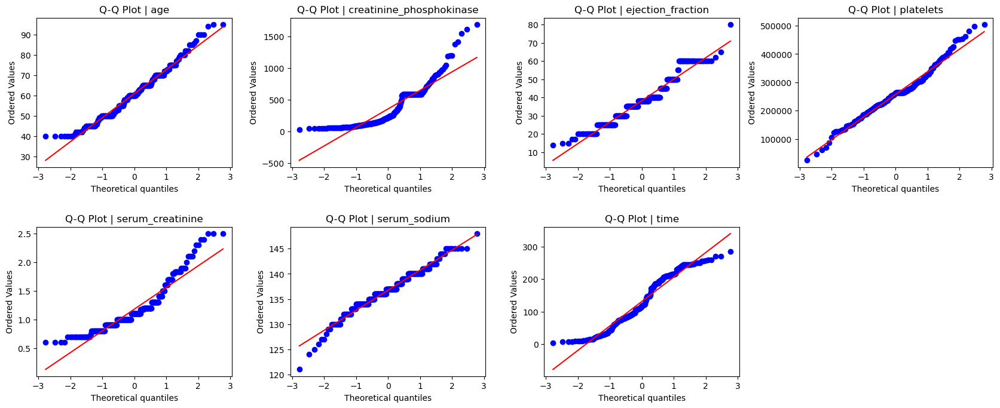

In [39]:
plt.figure(figsize=(20, 6))
plt.subplots_adjust(left=0, bottom=0, right=0.8, top=1, wspace=0.3, hspace=0.4)

for i, column in enumerate(raw_data_nonbinary.columns):
    plt.subplot(2, 4, i+1)
    stats.probplot(df_cleaned[column], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot | {column}')
    plt.xlabel('Theoretical quantiles')
    plt.ylabel('Ordered Values')
plt.show()

In [40]:
shapiro_wilk_array = []
for column in raw_data_nonbinary.columns:
    sw_stat, sw_p = stats.shapiro(df_cleaned[column])
    shapiro_wilk_array.append([column, round(sw_p, 4)])

shapiro_wilk_df = pd.DataFrame(data=shapiro_wilk_array, columns=['feature', 'sw_p_value'])

shapiro_wilk_df

,feature,sw_p_value
0,age,0.0004
1,creatinine_phosphokinase,0.0000
2,ejection_fraction,0.0000
3,platelets,0.0016
4,serum_creatinine,0.0000
5,serum_sodium,0.0004
6,time,0.0000


After perfoming ***Shapiro-Wilk*** test on normality, we conclude non of the features have normal distribution. It can be somewhat seen on Q-Q plots. 

In [41]:
ANOVA_array = []

for column in raw_data_nonbinary.columns:
    for bi_column in binary_columns:
        formula = f'{column} ~ C({bi_column})'
        model = ols(formula, data=df_cleaned).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        ANOVA_array.append([f'{column}',  f'{bi_column}', round(anova_table.iloc[0, -1], 4)])
ANOVA_df = pd.DataFrame(data = ANOVA_array, columns=['Feature', 'Distinction', 'p_value'])

ANOVA_df['p_value'] = ANOVA_df['p_value'].astype('float64')

ANOVA_df.sort_values(by='p_value', ascending=False)

,Feature,Distinction,p_value
25,serum_creatinine,diabetes,0.9925
11,creatinine_phosphokinase,DEATH_EVENT,0.9537
12,ejection_fraction,anaemia,0.9373
4,age,smoking,0.8950
18,platelets,anaemia,0.8790
33,serum_sodium,sex,0.8780
13,ejection_fraction,diabetes,0.8750
10,creatinine_phosphokinase,smoking,0.8022
8,creatinine_phosphokinase,high_blood_pressure,0.7957
19,platelets,diabetes,0.7863


We can see that even though *creatinine_phosphokinase* has non-zero ***MI*** score, it has approximately the same mean when conditioned on *DEATH_EVENT*.

In [42]:
ANOVA_df[ANOVA_df['p_value'] <= 0.05].sort_values(by='p_value', ascending=False)

,Feature,Distinction,p_value
15,ejection_fraction,sex,0.0441
31,serum_sodium,diabetes,0.0257
6,creatinine_phosphokinase,anaemia,0.0007
35,serum_sodium,DEATH_EVENT,0.0004
38,time,high_blood_pressure,0.0003
5,age,DEATH_EVENT,0.0000
17,ejection_fraction,DEATH_EVENT,0.0000
29,serum_creatinine,DEATH_EVENT,0.0000
41,time,DEATH_EVENT,0.0000


After perfoming ***ANOVA*** on each non-binary feature with respect to a binary one, we can see it coincides with our outcome of mutual information.

#### Experimental ***EDA***

We attempt to categorise numerical features, in order to perform independence tests on them.

In [43]:
df_experimental = df_cleaned.copy().drop(binary_columns[:-1], axis=1)
df_experimental_categorical = df_experimental.copy() 

In [44]:
df_experimental.describe()

,age,creatinine_phosphokinase,ejection_fraction,platelets,serum_creatinine,serum_sodium,time,DEATH_EVENT
count,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000
mean,60.980080,357.290837,38.254980,257516.406375,1.179721,136.741036,130.844622,0.302789
std,11.879546,318.577098,11.981599,80011.538715,0.399340,4.011068,76.569993,0.460383
min,40.000000,30.000000,14.000000,25100.000000,0.600000,121.000000,4.000000,0.000000
25%,51.000000,115.000000,30.000000,210000.000000,0.900000,134.000000,74.000000,0.000000
50%,60.000000,224.000000,38.000000,262000.000000,1.100000,137.000000,117.000000,0.000000
75%,70.000000,582.000000,45.000000,299000.000000,1.300000,140.000000,203.000000,1.000000
max,95.000000,1688.000000,80.000000,504000.000000,2.500000,148.000000,285.000000,1.000000


In [45]:
for key, value in unique_column_content_check(df_experimental).items():
    print(f'Column name: {key}\nUnique values:\n{value[0]}\nTotal unique values:{value[1]}\n\n')

Column name: age
Unique values:
[40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63
 64 65 66 67 68 69 70 72 73 75 77 78 79 80 82 85 86 87 90 94 95]
Total unique values:45


Column name: creatinine_phosphokinase
Unique values:
[  30   47   52   53   54   55   56   57   58   59   60   61   62   63
   64   66   68   69   70   72   76   78   80   84   86   88   90   91
   92   93   94   95   96   97   99  101  102  103  104  109  110  111
  112  113  115  118  119  121  122  124  125  127  128  129  130  131
  132  133  135  143  144  145  146  148  149  151  154  156  157  159
  161  166  167  168  170  171  176  180  185  190  191  193  196  198
  200  203  207  211  212  213  220  224  231  232  233  244  245  246
  248  249  250  253  257  258  260  280  281  291  298  305  308  315
  318  320  326  335  336  337  358  364  369  371  379  395  400  418
  446  478  482  514  571  572  577  582  588  607  615  618  624  646
  655  675  707  719  720  737  748  754  

In [46]:
df_experimental_categorical['age'] = df_experimental['age'].apply(lambda x: 'low' if x <= 58 else ('medium' if x <= 76 else 'high'))
df_experimental_categorical['creatinine_phosphokinase'] = df_experimental['creatinine_phosphokinase'].apply(lambda x: 'normal' if x <= 132 else ('high' if x < 700 else 'extremely high'))
df_experimental_categorical['ejection_fraction'] = df_experimental['ejection_fraction'].apply(lambda x: 'low' if x <= 40 else ('medium' if x <= 50 else 'normal'))
df_experimental_categorical['platelets'] = df_experimental['platelets'].apply(lambda x: 'low' if x <= 150_000 else ('normal' if x <= 400_000 else 'high'))
df_experimental_categorical['serum_creatinine'] = df_experimental['serum_creatinine'].apply(lambda x: 'low' if x <= 0.75 else ('normal' if x <= 1.3 else 'high'))
df_experimental_categorical['serum_sodium'] = df_experimental['serum_sodium'].apply(lambda x: 'low' if x <= 134 else ('normal' if x <= 145 else 'high'))
df_experimental_categorical['time'] = df_experimental['time'].apply(lambda x: 'high prob' if x <= 75 else ('moderate prob' if x <= 150 else 'low prob'))


df_experimental_categorical

,age,creatinine_phosphokinase,ejection_fraction,platelets,serum_creatinine,serum_sodium,time,DEATH_EVENT
0,medium,high,low,normal,high,low,high prob,1
2,medium,high,low,normal,normal,low,high prob,1
3,low,normal,low,normal,high,normal,high prob,1
5,high,normal,low,normal,high,low,high prob,1
6,medium,high,low,low,normal,normal,high prob,1
...,...,...,...,...,...,...,...,...
291,medium,high,low,low,high,normal,low prob,0
292,low,high,low,normal,normal,normal,low prob,0
293,medium,normal,low,normal,normal,normal,low prob,0
294,medium,normal,low,normal,normal,normal,low prob,0


Our new labels:
- *age* || $x \leqslant 58\mapsto$ **low** | $58 < x \leqslant 76\mapsto$ **medium** | $76 < x\mapsto$ **high**

- *creatinine_phosphokinase* || $x \leqslant 132\mapsto$ **normal** | $132 < x \leqslant 700\mapsto$ **high** | $700 < x\mapsto$ **extremely high**
- *ejection_fraction* || $x \leqslant 40\mapsto$ **low** | $40 < x \leqslant 50\mapsto$ **medium** | $50 < x\mapsto$ **normal**
- *platelets* || $x \leqslant 150000\mapsto$ **low** | $150000 < x \leqslant 400000\mapsto$ **normal** | $400000 < x\mapsto$ **high**
- *serum_creatinine* || $x \leqslant 0.75\mapsto$ **low** | $0.75 < x \leqslant 1.3\mapsto$ **normal** | $1.3 < x\mapsto$ **high**
- *serum_sodium* || $x \leqslant 134\mapsto$ **low** | $134 < x \leqslant 145\mapsto$ **normal** | $145 < x\mapsto$ **high**
- *time* || $x \leqslant 75\mapsto$ **low** | $75 < x \leqslant 150\mapsto$ **normal** | $150 < x\mapsto$ **high**

Everything is inspired by medical sources and/or our analysis of the data. Some are approximated due to differences in threshold due to gender.

In [47]:
ordinal_permutations = list(itertools.combinations(df_experimental_categorical.columns, 2))
chi2_independency_array = []

summed_table = df_experimental_categorical.shape[0]
for columns in ordinal_permutations:
    cross_table = pd.crosstab(df_experimental_categorical[columns[0]], df_experimental_categorical[columns[1]], rownames=[columns[0]], colnames=[columns[1]])
    chi2, p, dof, expected = stats.chi2_contingency(cross_table)
    if p <= 0.05:
        cramers_v = np.sqrt(chi2 / (summed_table * (min(cross_table.shape) - 1)))
    else:
        cramers_v = np.nan

    chi2_independency_array.append([columns[0], columns[1], round(p, 4), cramers_v])

chi2_independency_df_ordinal = pd.DataFrame(data=chi2_independency_array, columns=['ordinal 1', 'ordinal 2', 'chi2 p_value', 'cramers V'])

chi2_independency_df_ordinal.sort_values(by='chi2 p_value', ascending=False)

,ordinal 1,ordinal 2,chi2 p_value,cramers V
13,ejection_fraction,platelets,0.8739,NaN
19,platelets,serum_sodium,0.7299,NaN
0,age,creatinine_phosphokinase,0.6762,NaN
23,serum_creatinine,time,0.6733,NaN
12,creatinine_phosphokinase,DEATH_EVENT,0.5573,NaN
21,platelets,DEATH_EVENT,0.5544,NaN
25,serum_sodium,time,0.5117,NaN
14,ejection_fraction,serum_creatinine,0.4730,NaN
7,creatinine_phosphokinase,ejection_fraction,0.3873,NaN
2,age,platelets,0.3520,NaN


In [48]:
chi2_independency_df_ordinal[chi2_independency_df_ordinal['chi2 p_value'] <= 0.05].sort_values(by='chi2 p_value', ascending=False)

,ordinal 1,ordinal 2,chi2 p_value,cramers V
1,age,ejection_fraction,0.0431,0.140061
22,serum_creatinine,serum_sodium,0.0074,0.166877
26,serum_sodium,DEATH_EVENT,0.0017,0.225072
6,age,DEATH_EVENT,0.0002,0.261071
24,serum_creatinine,DEATH_EVENT,0.0000,0.339075
27,time,DEATH_EVENT,0.0000,0.592479


Having in mind ***Violin Plots***, ***Mutual Information***, and ***ANOVA*** we can *clearly* see the prominence of *time*, *serum_creatinine*, *age*, *serum_sodium*, and *ejection_fraction* in relation to *DEATH_EVENT*.

# ***Preprocessing***

In [49]:
preprocessing_pipeline = make_pipeline(
    CustomMinMaxScaler(columns=['age', 'ejection_fraction', 'serum_sodium', 'serum_creatinine', 'time']),
    DropColumnTransformer(columns=['smoking', 'anaemia', 'platelets', 'creatinine_phosphokinase', 'diabetes', 'high_blood_pressure', 'sex']),
)
df_preprocessed_with_target = preprocessing_pipeline.fit_transform(df_cleaned)
df_preprocessed_with_target

,age,ejection_fraction,serum_creatinine,serum_sodium,time,DEATH_EVENT
0,0.636364,0.090909,0.684211,0.333333,0.000000,1
2,0.454545,0.090909,0.368421,0.296296,0.010676,1
3,0.181818,0.090909,0.684211,0.592593,0.010676,1
5,0.909091,0.393939,0.789474,0.407407,0.014235,1
6,0.636364,0.015152,0.315789,0.592593,0.021352,1
...,...,...,...,...,...,...
291,0.363636,0.318182,0.421053,0.666667,0.903915,0
292,0.218182,0.363636,0.210526,0.703704,0.903915,0
293,0.418182,0.318182,0.157895,0.555556,0.946619,0
294,0.400000,0.363636,0.263158,0.814815,0.946619,0


## Resolving Imbalance
As shown in EDA section, one class dominates the other one by covering approximately 68% of the instances. This causes an imbalance in the dataset, which is resolved below.

We can use: 
- Over-sampling: create new synthetic examples in the minority class (with SMOTE)
- Under-sampling: delete or merge examples in the majority class (with Random Sampler)
- A combo of both (with SMOTEENN)

Class=1, n=175 (50.000%)
Class=0, n=175 (50.000%)


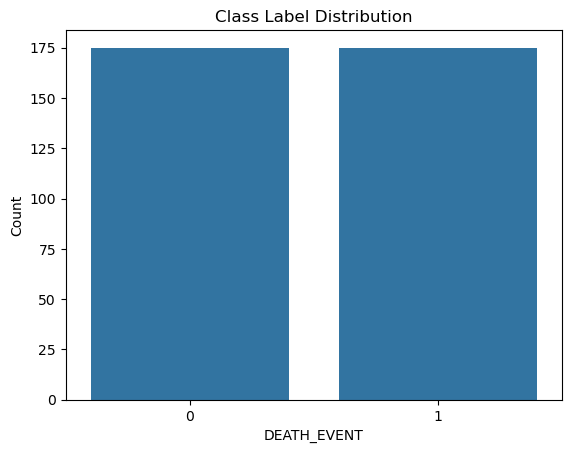

Class=0, n=76 (50.000%)
Class=1, n=76 (50.000%)


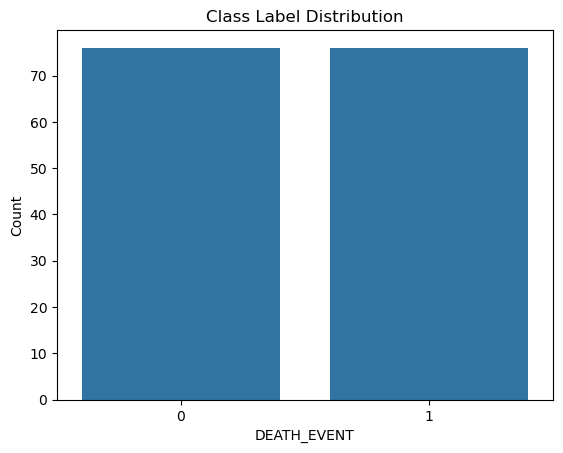

Class=0, n=127 (48.289%)
Class=1, n=136 (51.711%)


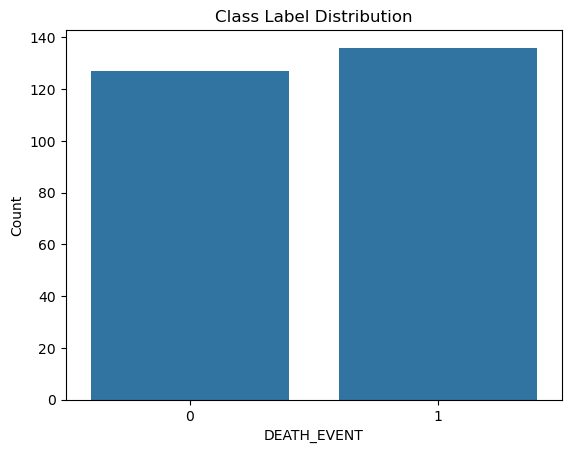

Original shape: (251, 5)
Oversampled dataset shape:" (350, 5)
Undersampled dataset shape: (152, 5)
Sampled dataset shape (SMOTEENN): (263, 5)


In [50]:
### Oversample with SMOTE
df_copy = df_preprocessed_with_target.copy()

# Split features and target
y = df_copy['DEATH_EVENT']
X = df_copy.drop(['DEATH_EVENT'], axis=1)

smote_sampler = SMOTE(random_state=42)
oversampled_X, oversampled_y = smote_sampler.fit_resample(X, y)

# Plot resulting distribution
plot_class_distribution(oversampled_y, 'DEATH_EVENT')


### Undersample with Randome Under Sampler
rand_sampler = RandomUnderSampler(random_state=42)
undersampled_X, undersampled_y = rand_sampler.fit_resample(X, y)

# Plot resulting distribution
plot_class_distribution(undersampled_y, 'DEATH_EVENT')


### SMOTEENN
smoteenn_sampler = SMOTEENN(random_state=42)
combo_sampled_X, combo_sampled_y = smoteenn_sampler.fit_resample(X, y)

# Plot resulting distribution
plot_class_distribution(combo_sampled_y, 'DEATH_EVENT')


print(f'Original shape: {X.shape}')
print(f'Oversampled dataset shape:" {oversampled_X.shape}')
print(f'Undersampled dataset shape: {undersampled_X.shape}')
print(f'Sampled dataset shape (SMOTEENN): {combo_sampled_X.shape}')



### ***LDA*** (Linear Discriminant Analysis)
Since LDA is a supervised DR algorithm, we need to include the target in the dataset. For this purpose, we'll be employing our previously resampled data.

We will have only one component because the number of components (aka linear discriminants) is determined by the number of unique labels in the target variable; `DEATH_EVENT` , i.e., our target, is a binary variable.

Linear Discriminant Analysis (LDA) is a technique used to find the best separation between different groups or categories in a dataset. Unlike PCA, which focuses on capturing the most variance in the data, LDA aims to maximize the separation between different classes while minimizing the variation within each class.

Mathematically, LDA works by:

1. Calculating the Means: It computes the mean for each class and the overall mean of the data.
2. Within-Class and Between-Class Variance: It then calculates the within-class scatter (how much the data points in each class vary) and the between-class scatter (how much the means of the different classes vary from each other).
3. Maximizing Separation: LDA finds the linear combinations of the original variables that maximize the ratio of between-class variance to within-class variance. These combinations are called linear discriminants.

The result is a transformation that projects the data onto a new space where the classes are as distinct as possible. This is particularly useful for classification tasks, where the goal is to distinguish between different categories based on their features.

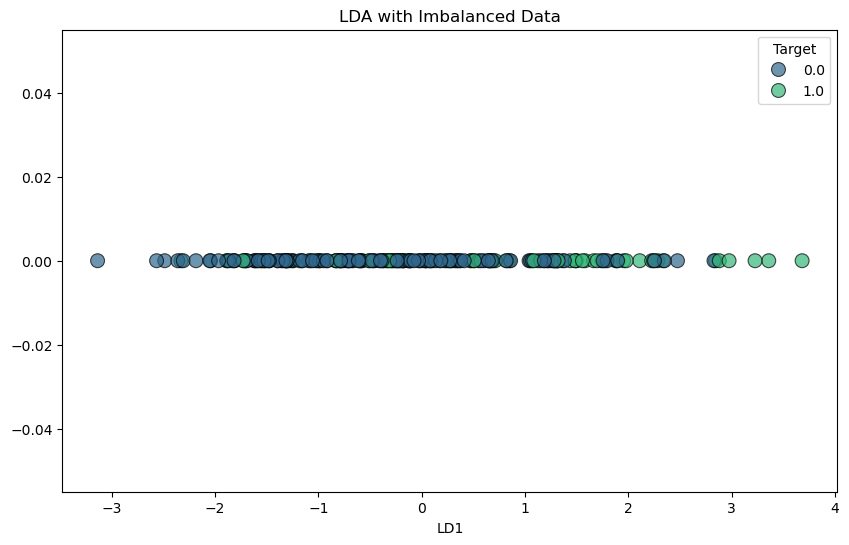

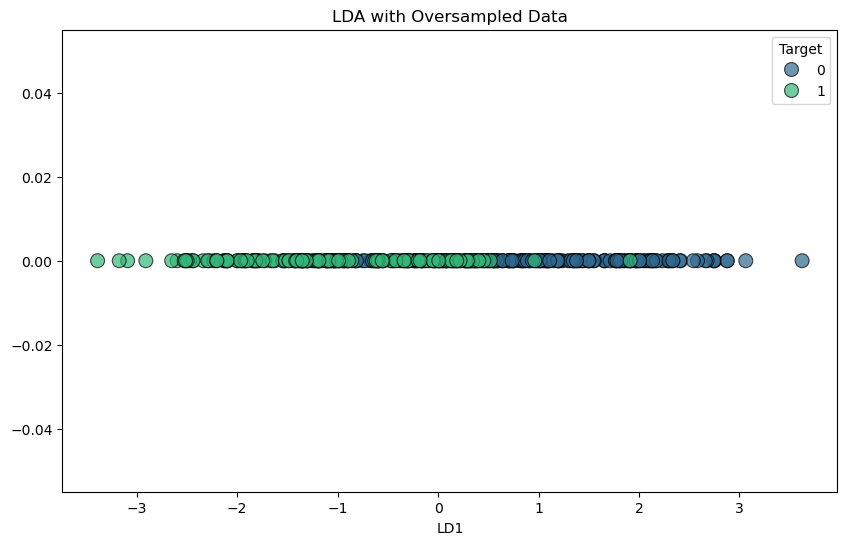

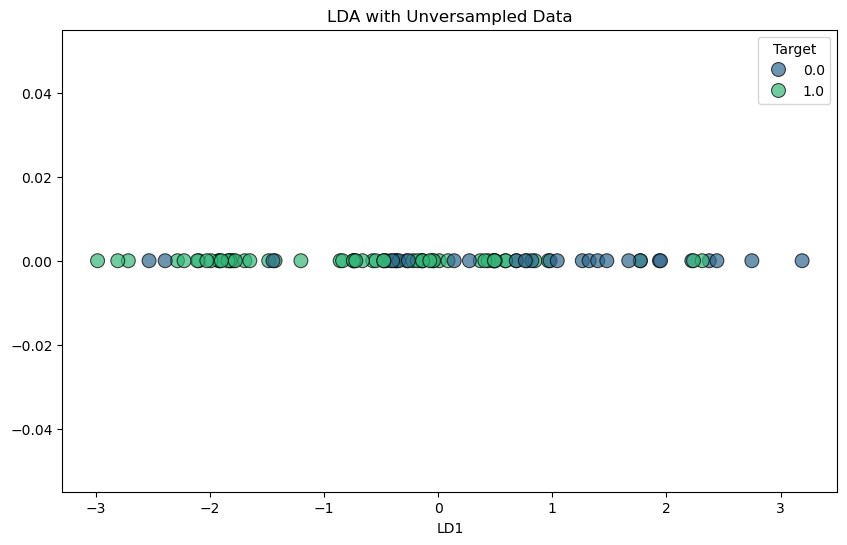

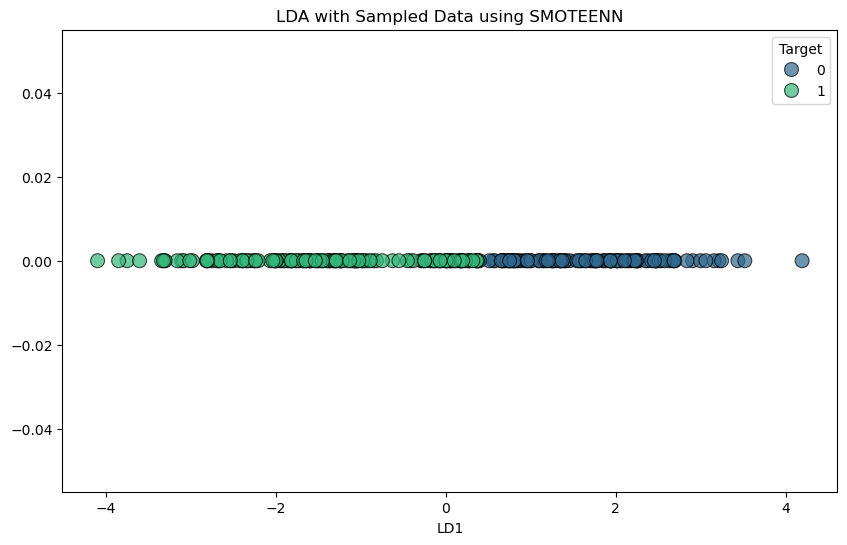

In [51]:
# Using imbalanced data
title = 'LDA with Imbalanced Data'
lda_transform_plot(X, y, title=title)

# Using oversampled data
title = 'LDA with Oversampled Data'
lda_transform_plot(oversampled_X, oversampled_y, title=title)

# Using undersampled data
title = 'LDA with Unversampled Data'
lda_transform_plot(undersampled_X, undersampled_y, title)

# Using data sampled with SMOTEENN
title = 'LDA with Sampled Data using SMOTEENN'
lda_transform_plot(combo_sampled_X, combo_sampled_y, title)

#### Interpretation - LDA
Each point represents a data point (instance).
As can be seen above, the most discriminative performance is demonstrated in the fourth plot. The instances seem to be perfectly separated along the x-axis (LD1).

Based on this outcome, we will continue our journey using ***SMOTEENN*** sampling for imbalance.

### PCA for preprocessed data **without** sampling

PCA works by mathematically transforming the data into a new coordinate system. It starts by calculating the covariance matrix of the data, which captures how much the variables vary together. Then, it finds the eigenvectors and eigenvalues of this matrix.

The eigenvectors represent the directions of maximum variance (principal components), and the eigenvalues indicate the amount of variance along these directions. The data is then projected onto these principal components, resulting in a new set of uncorrelated variables that capture the most significant patterns in the original dataset. The principal components are ordered by the amount of variance they explain, allowing for dimensionality reduction by selecting only the top components.

In [52]:
# Drop target to use data in PCA, etc.
df_preprocessed = df_preprocessed_with_target.drop(['DEATH_EVENT'], axis=1)

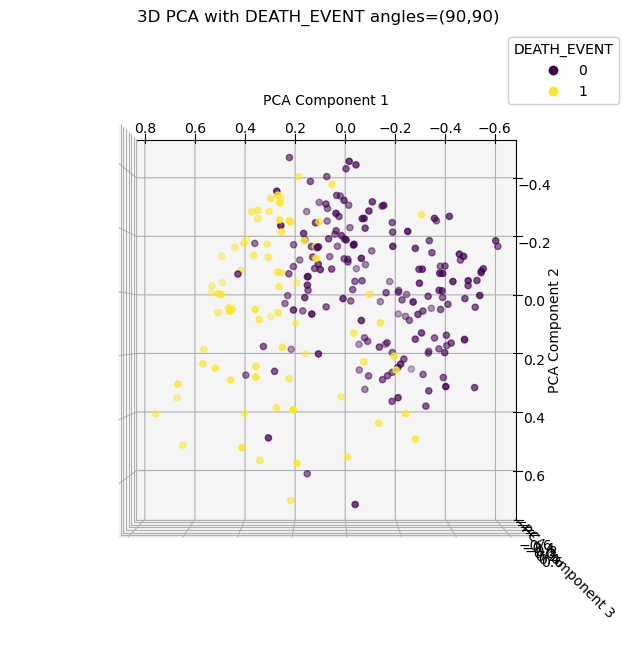

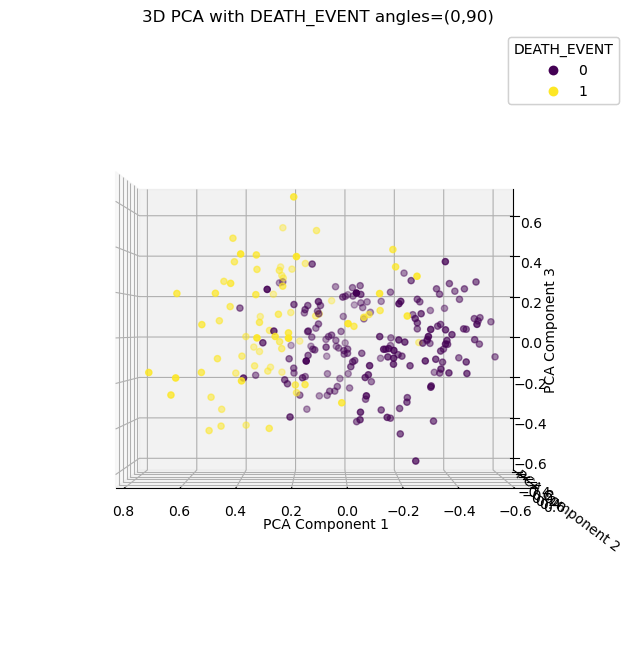

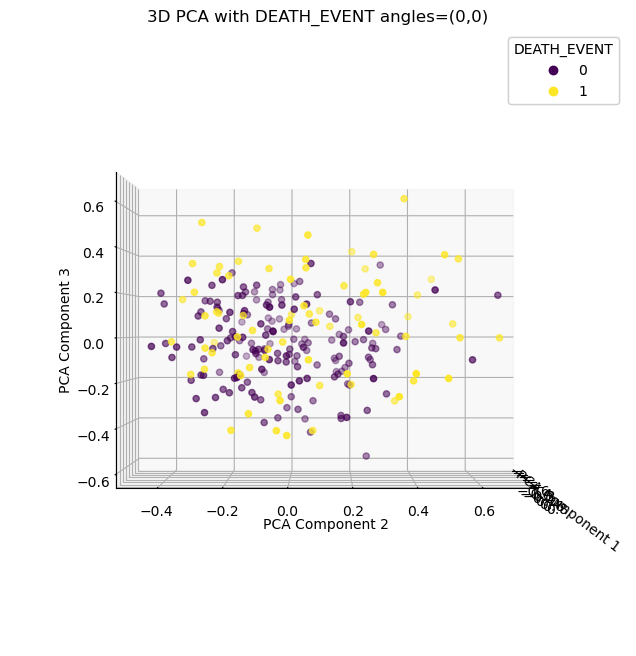

In [53]:
# PCA for 3 components
pca_3d = PCA(n_components=3)
df_pca_3d = pca_3d.fit_transform(df_preprocessed)

plot_algo3d(df_pca_3d, df_cleaned['DEATH_EVENT'], algo_name="PCA", target_name='DEATH_EVENT')

After taking a glance at scatter plots of all the 3 principal components of **PCA** one can suspect that ***PC1*** and ***PC3*** convey the most information about *DEATH_EVENT*.

Explained variance ratio for each component (3D PCA):
Principal Component 1: 0.3718
Principal Component 2: 0.2320
Principal Component 3: 0.1931
Sum of variances: 0.797


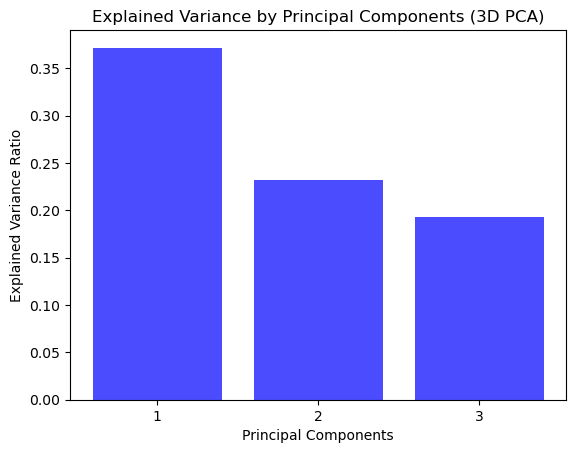

In [54]:
plot_explained_variance(pca_3d)

We managed to get almost $80\%$ of variance explained in our ***3 PCs*** using 5 features for it. 

In [55]:
show_pca_weights(df_pca_3d, pca_3d, df_preprocessed)

,PC1,PC2,PC3
age,0.371590,0.405830,-0.734096
ejection_fraction,-0.044926,-0.247834,-0.545849
serum_creatinine,0.294747,0.723531,0.252728
serum_sodium,-0.095767,-0.213266,-0.265462
time,-0.873988,0.452659,-0.169736


- ***PC1***: *age*, *serum_creatinine* and *time* have the highest weight

- ***PC2*** and ***PC3***: there are no near zero weights, so we cannot try to exclude any features

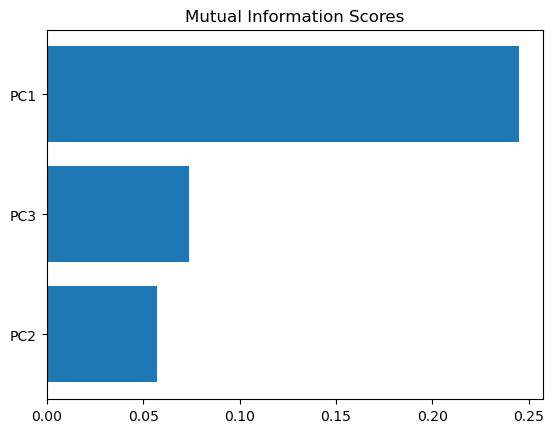

<Figure size 800x500 with 0 Axes>

In [56]:
component_names_pca_3d = [f"PC{i+1}" for i in range(df_pca_3d.shape[1])]
df_pca_3d_structurized = pd.DataFrame(df_pca_3d, columns=component_names_pca_3d)

mi_scores_pca = make_mi_scores(df_pca_3d_structurized, df_cleaned['DEATH_EVENT'])

plot_mi_scores(mi_scores_pca)

We can see the confirmation of our guess. ***PC1*** conveys the most information, with ***PC2*** and ***PC3*** being close in value, but low. 

It explains what we saw on our plots - ***PC2*** and ***PC3*** divide people terribly, whilst (***PC1*** and ***PC2***) or (***PC1*** and ***PC3***) do better because of ***PC1*** [***PC3*** performs better visually, since it has slightly higher ***MI*** score]. 

### PCA for preprocessed data **with** ***SMOTEENN*** sampling

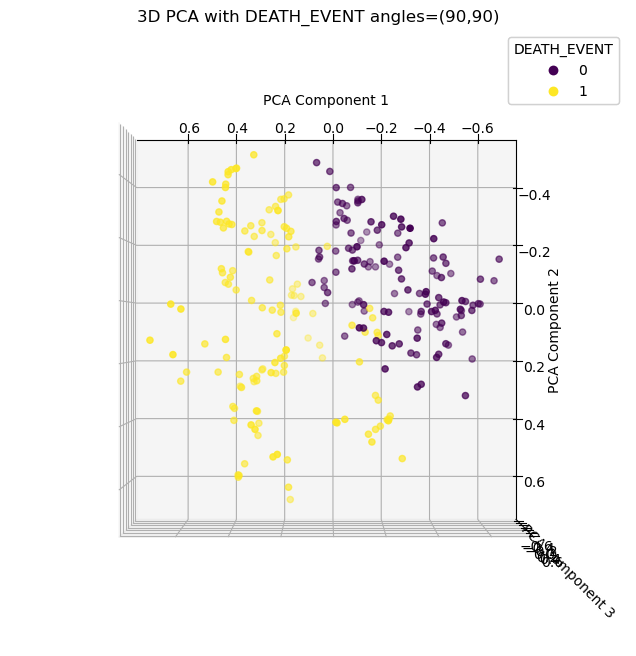

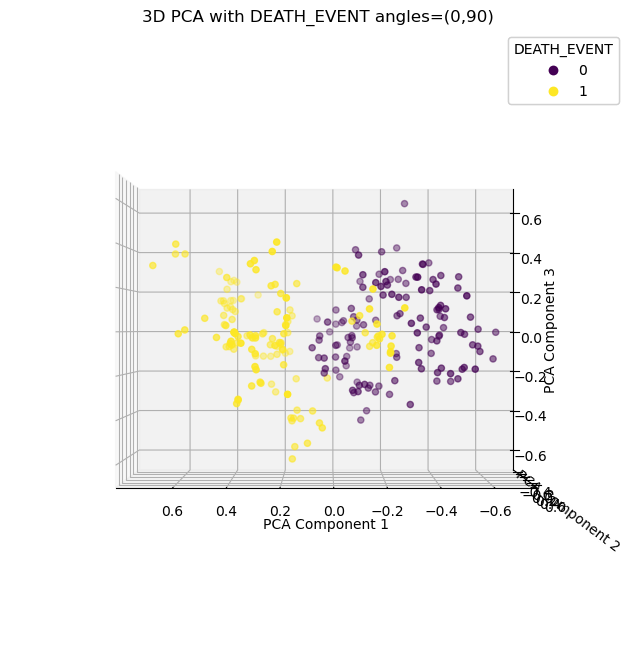

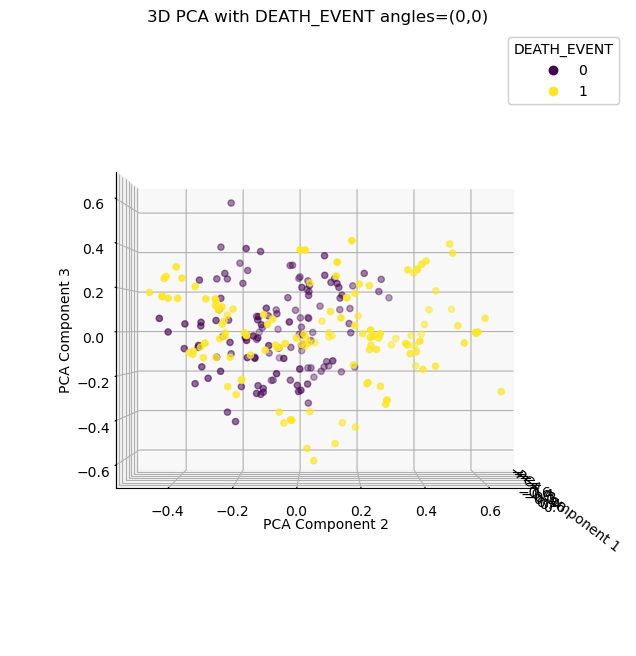

In [57]:
# PCA for 3 components
pca_3d_smoteenn = PCA(n_components=3)
df_pca_3d_smoteenn = pca_3d_smoteenn.fit_transform(combo_sampled_X)

plot_algo3d(df_pca_3d_smoteenn, combo_sampled_y, algo_name="PCA", target_name='DEATH_EVENT')

Explained variance ratio for each component (3D PCA):
Principal Component 1: 0.4026
Principal Component 2: 0.2506
Principal Component 3: 0.1747
Sum of variances: 0.828


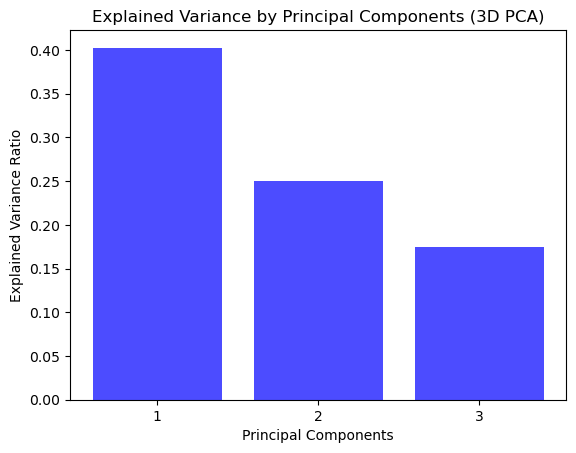

In [58]:
plot_explained_variance(pca_3d_smoteenn)

Explained Variance jumped from $80\%\to 83\%$.

In [59]:
show_pca_weights(df_pca_3d_smoteenn, pca_3d_smoteenn, df_preprocessed)

,PC1,PC2,PC3
age,0.414899,-0.240145,0.806521
ejection_fraction,-0.073586,-0.420883,0.205463
serum_creatinine,0.357911,0.744879,0.250490
serum_sodium,-0.120833,-0.353731,0.129374
time,-0.824466,0.291920,0.477310


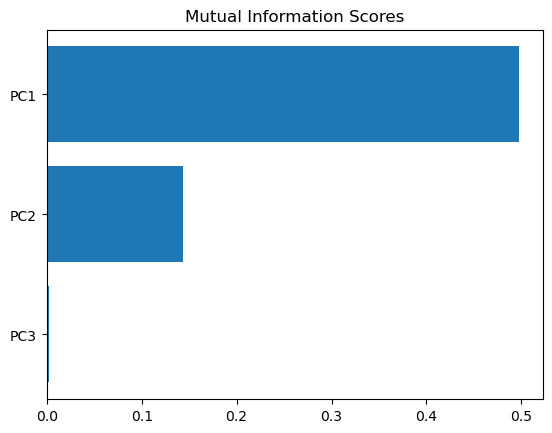

<Figure size 800x500 with 0 Axes>

In [60]:
component_names_pca_3d_smoteenn = [f"PC{i+1}" for i in range(df_pca_3d_smoteenn.shape[1])]
df_pca_3d_smoteenn_structurized = pd.DataFrame(df_pca_3d_smoteenn, columns=component_names_pca_3d_smoteenn)

mi_scores_pca_smoteenn = make_mi_scores(df_pca_3d_smoteenn_structurized, combo_sampled_y)

plot_mi_scores(mi_scores_pca_smoteenn)

We can see that ***MI*** score for ***PC3*** is almost $0$, so we can confidently convey all of the information using only ***PC1*** and ***PC2***.

### ***UMAP***

Uniform Manifold Approximation and Projection (UMAP) is a technique used to reduce the dimensionality of data, making it easier to visualize and analyze. Like PCA, UMAP simplifies complex datasets, but it focuses more on preserving the local structure of the data rather than just capturing the most variance.

Mathematically, UMAP works by:

1. Constructing a Graph: It first constructs a graph representing the data points, where each point is connected to its nearest neighbors, forming a high-dimensional space.
2. High-Dimensional Representation: UMAP uses a mathematical framework called "fuzzy simplicial sets" to understand the local structure of this space.
3. Optimization: It then optimizes the layout by minimizing a cost function that measures how well the low-dimensional representation preserves the high-dimensional structure.

The result is a low-dimensional representation, often in 2D or 3D, where similar data points are placed close together and dissimilar ones are pushed apart. This makes UMAP particularly useful for visualizing complex data and uncovering patterns, clusters, or relationships that might not be apparent in the high-dimensional space.

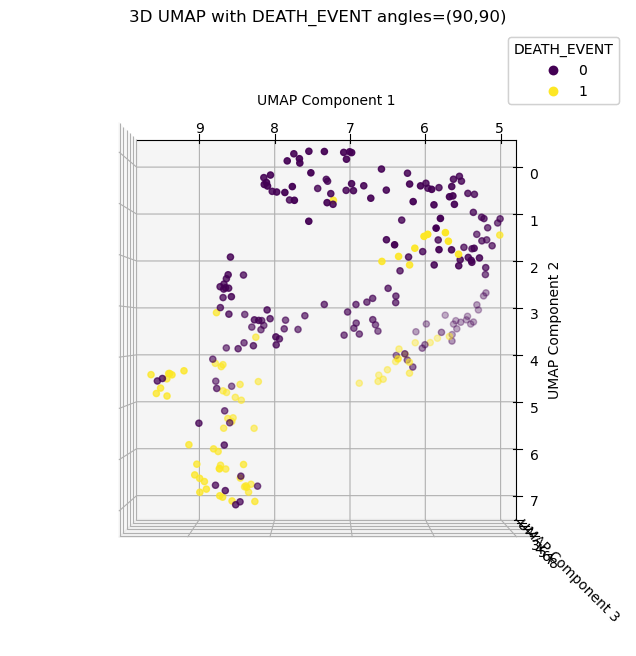

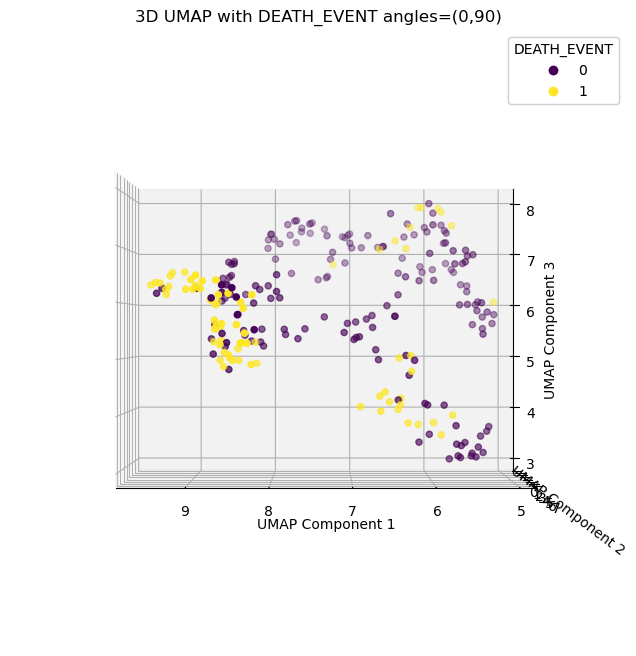

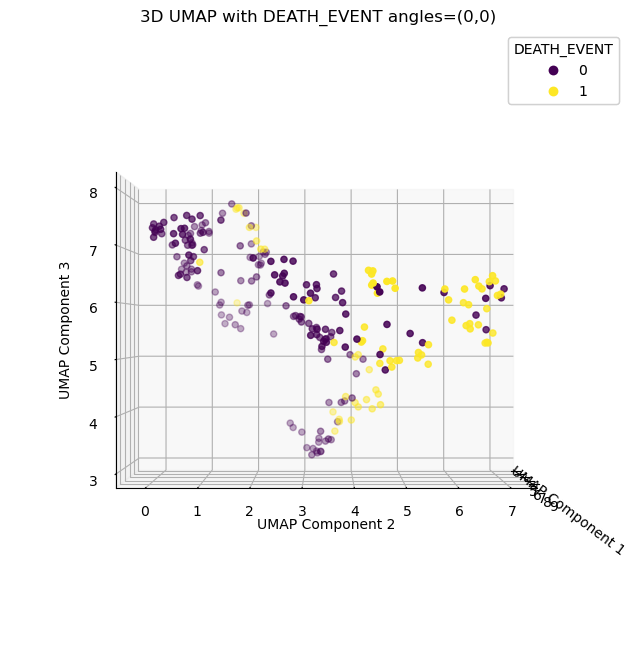

In [61]:
reducer = umap.UMAP(n_components=3, random_state=3721)
embedding = reducer.fit_transform(df_preprocessed)

plot_algo3d(embedding, df_preprocessed_with_target['DEATH_EVENT'], algo_name='UMAP', target_name="DEATH_EVENT")

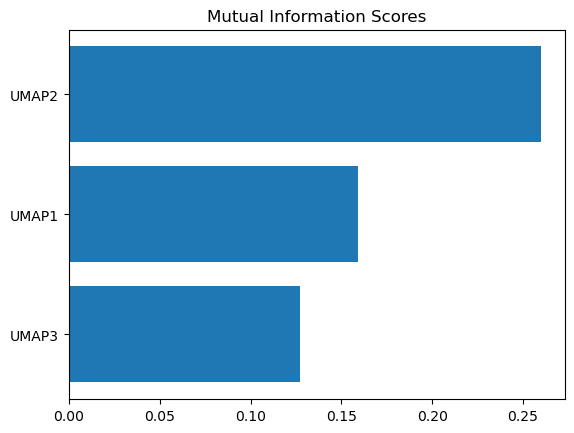

<Figure size 800x500 with 0 Axes>

In [62]:
component_names_umap_3d = [f"UMAP{i+1}" for i in range(embedding.shape[1])]
df_umap_3d_structurized = pd.DataFrame(embedding, columns=component_names_umap_3d)

mi_scores_umap = make_mi_scores(df_umap_3d_structurized, df_preprocessed_with_target['DEATH_EVENT'])

plot_mi_scores(mi_scores_umap)

We can see that ***UMAP2*** conveys the most (but still not much) information about the target, ***UMAP1*** and ***UMAP2*** provides small amount of information. 

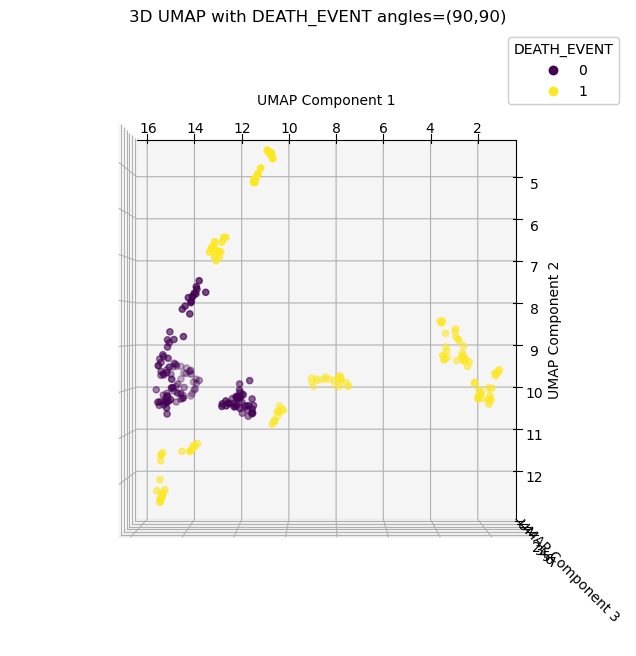

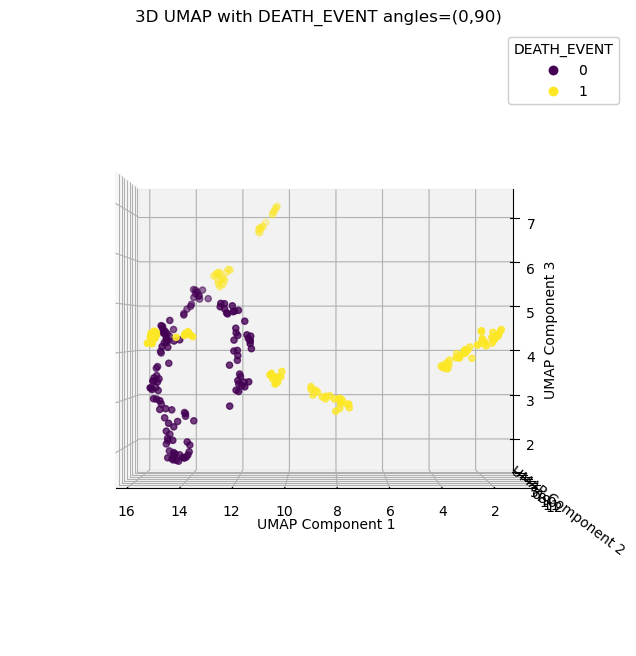

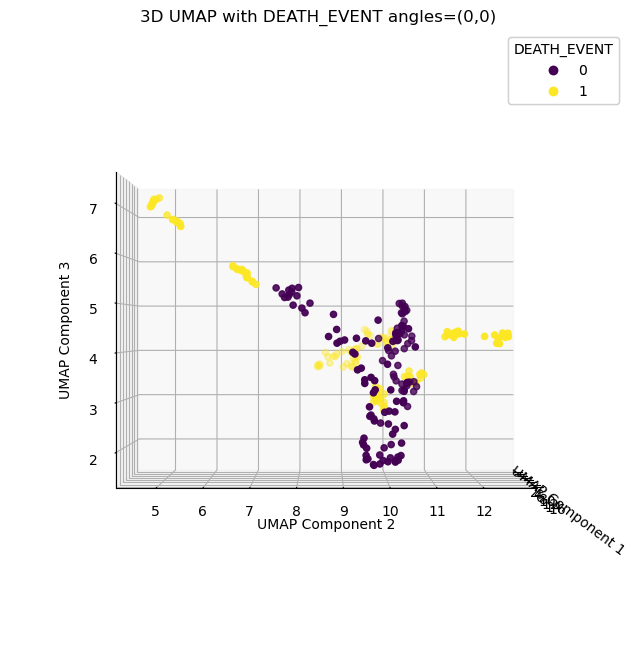

In [63]:
reducer_smoteenn = umap.UMAP(n_components=3, random_state=3721)
embedding_smoteenn = reducer_smoteenn.fit_transform(combo_sampled_X)

plot_algo3d(embedding_smoteenn, combo_sampled_y, algo_name='UMAP', target_name="DEATH_EVENT")

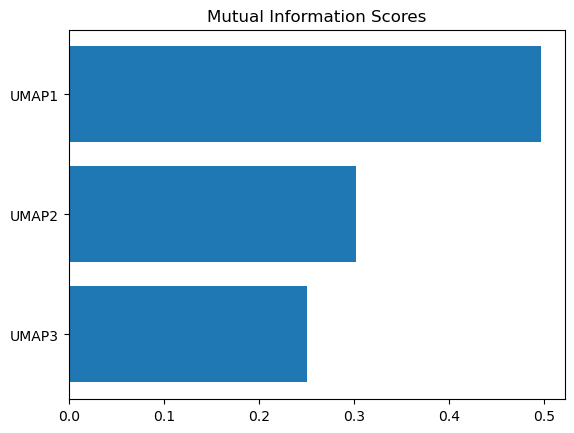

<Figure size 800x500 with 0 Axes>

In [64]:
component_names_umap_3d_smoteenn = [f"UMAP{i+1}" for i in range(embedding_smoteenn.shape[1])]
df_umap_3d_structurized_smoteenn = pd.DataFrame(embedding_smoteenn, columns=component_names_umap_3d_smoteenn)

mi_scores_umap = make_mi_scores(df_umap_3d_structurized_smoteenn, combo_sampled_y)

plot_mi_scores(mi_scores_umap)

After using ***SMOTEENN*** we can see that all of the ***UMAP*** compontents provide valuable information about the target which we can clearly see on the plots above.

### ***Isomap***

Isomap (Isometric Mapping) is a dimensionality reduction technique used to uncover the underlying structure of high-dimensional data while preserving the geometric distances between data points. It's particularly useful for visualizing complex data where nonlinear relationships exist.

Here's a breakdown of how Isomap works:

1. Constructing a Neighborhood Graph: Isomap starts by identifying the nearest neighbors for each data point based on a distance metric (usually Euclidean distance). It creates a graph where each data point is connected to its closest neighbors.
2. Calculating Geodesic Distances: Instead of using straight-line distances, Isomap calculates the shortest paths (geodesic distances) between all pairs of data points in the neighborhood graph. This step helps capture the true structure of the data, accounting for any nonlinear relationships.
3. Multidimensional Scaling (MDS): Isomap then uses a technique called Multidimensional Scaling to embed the data into a lower-dimensional space. MDS finds a new configuration of points in a lower-dimensional space that preserves the geodesic distances as much as possible.

The final result is a low-dimensional representation of the data, where the relationships between data points are preserved based on their geodesic distances. This makes Isomap a powerful tool for visualizing and exploring the intrinsic geometry of data, especially when the data lies on a curved manifold in a higher-dimensional space.

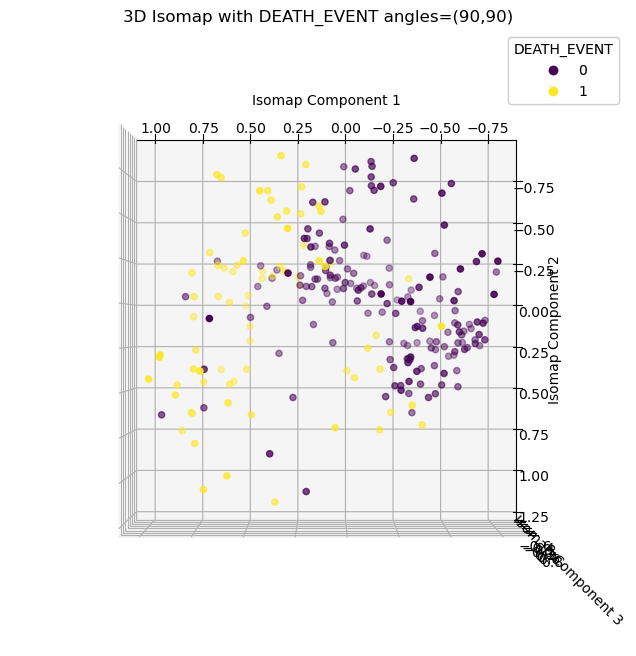

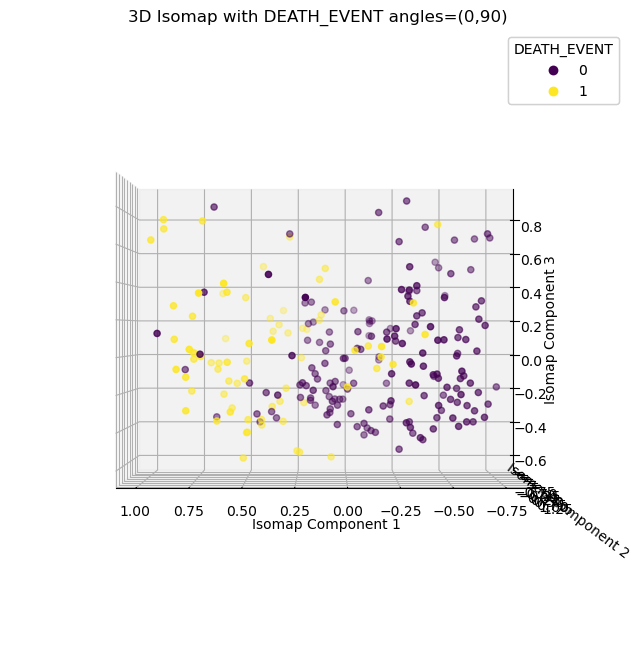

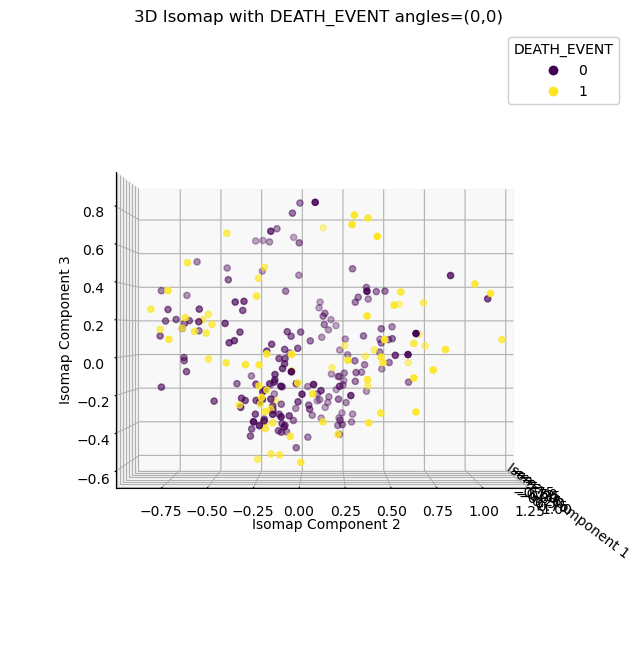

In [65]:
isomap = Isomap(n_neighbors=5, n_components=3)
iso_df = isomap.fit_transform(df_preprocessed)

plot_algo3d(iso_df, df_preprocessed_with_target['DEATH_EVENT'], algo_name='Isomap', target_name="DEATH_EVENT")

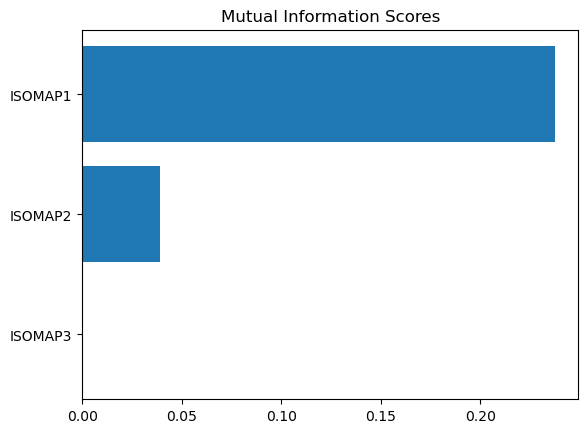

<Figure size 800x500 with 0 Axes>

In [66]:
component_names_isomap_3d = [f"ISOMAP{i+1}" for i in range(iso_df.shape[1])]
df_isomap_3d_structurized = pd.DataFrame(iso_df, columns=component_names_isomap_3d)

mi_scores_isomap = make_mi_scores(df_isomap_3d_structurized, df_preprocessed_with_target['DEATH_EVENT'])

plot_mi_scores(mi_scores_isomap)

We can see that ***ISOMAP1*** conveys the most (but still small) information, ***ISOMAP2*** conveys miniscule amount, whilst ***ISOMAP3*** conveys none.

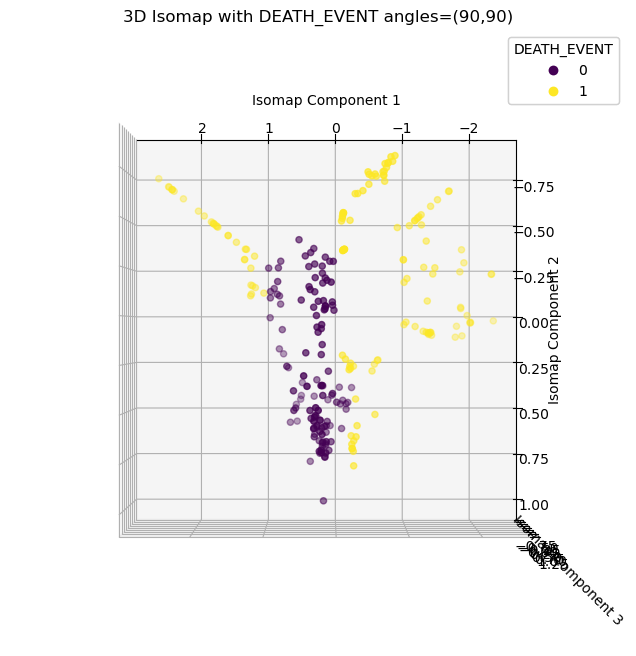

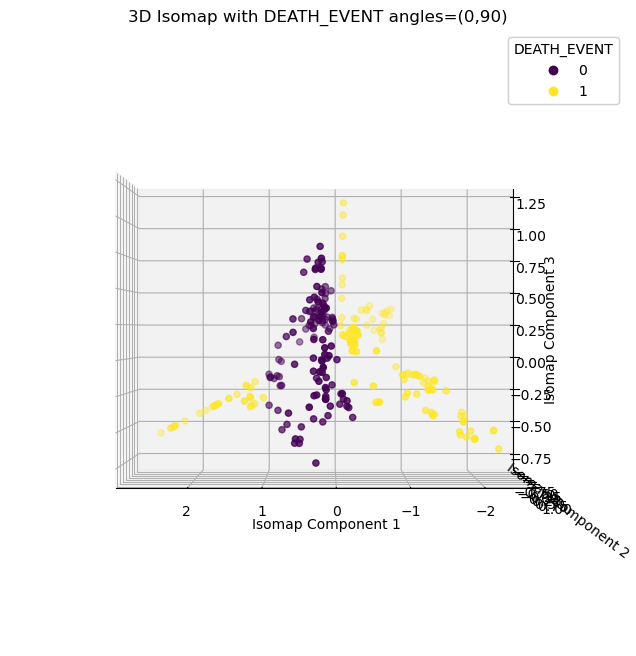

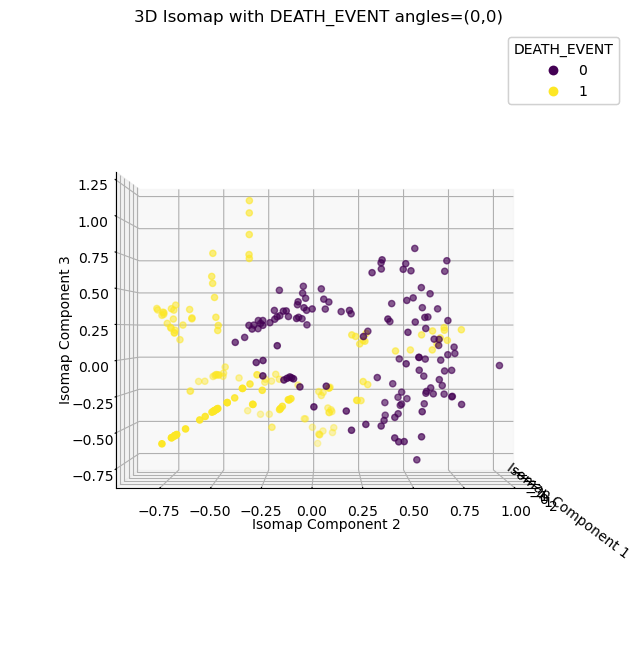

In [67]:
isomap_smoteenn = Isomap(n_neighbors=5, n_components=3)
iso_smoteenn_df = isomap.fit_transform(combo_sampled_X)

plot_algo3d(iso_smoteenn_df, combo_sampled_y, algo_name='Isomap', target_name="DEATH_EVENT")

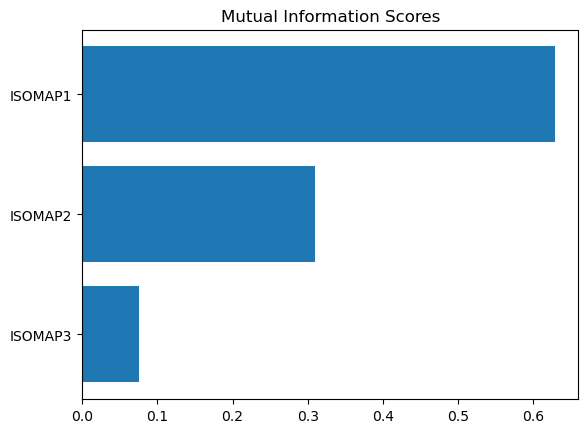

<Figure size 800x500 with 0 Axes>

In [68]:
component_names_isomap_smoteenn_3d = [f"ISOMAP{i+1}" for i in range(iso_smoteenn_df.shape[1])]
df_isomap_smoteenn_3d_structurized = pd.DataFrame(iso_smoteenn_df, columns=component_names_isomap_smoteenn_3d)

mi_scores_isomap_smoteenn = make_mi_scores(df_isomap_smoteenn_3d_structurized, combo_sampled_y)

plot_mi_scores(mi_scores_isomap_smoteenn)

After **SMOTEENN**, ***ISOMAP1*** conveys a lot of information, ***ISOMAP2*** moderate, and ***ISOMAP3*** small amount. 

***ISOMAP1*** retains more information from the ***SMOTEENN-sampled*** data.
This suggests that focusing on ***ISOMAP1***, and possibly ***ISOMAP2***, would be more beneficial for understanding and interpreting the data, while ***ISOMAP3*** could potentially be discarded or given less importance.

### ***t-SNE***

We'll apply t-SNE on both the SMOTEENN-sampled data and the PCA-reduced SMOTEENN-sampled data.

t-SNE (t-Distributed Stochastic Neighbor Embedding) is a dimensionality reduction technique primarily used for visualizing high-dimensional data in a low-dimensional space, typically 2D or 3D. It's particularly effective at revealing the structure of the data, such as clusters or complex relationships, even when these structures are non-linear.

Here's how t-SNE works:

1. Measuring Similarities in High Dimensions: t-SNE begins by calculating the similarity between each pair of data points in the high-dimensional space. It uses a probability distribution, typically a Gaussian, to measure how similar one point is to another, focusing more on preserving the relative distances between nearby points.
2. Defining Similarities in Low Dimensions: In the lower-dimensional space, t-SNE again defines similarities between points, but this time using a Student's t-distribution, which has heavier tails than a Gaussian distribution. This choice helps t-SNE spread out the points more evenly and prevents them from crowding together.
3. Minimizing the Difference: t-SNE then adjusts the positions of the points in the low-dimensional space to minimize the difference between the pairwise similarities in the original high-dimensional space and the newly mapped space. This is done through an optimization process, ensuring that points that were close in the original space remain close in the low-dimensional representation.

The result is a map where similar data points are grouped together, and dissimilar points are far apart, making it easy to identify patterns like clusters or outliers. t-SNE is especially useful for exploratory data analysis, providing a visually intuitive way to understand the complex structure of data.

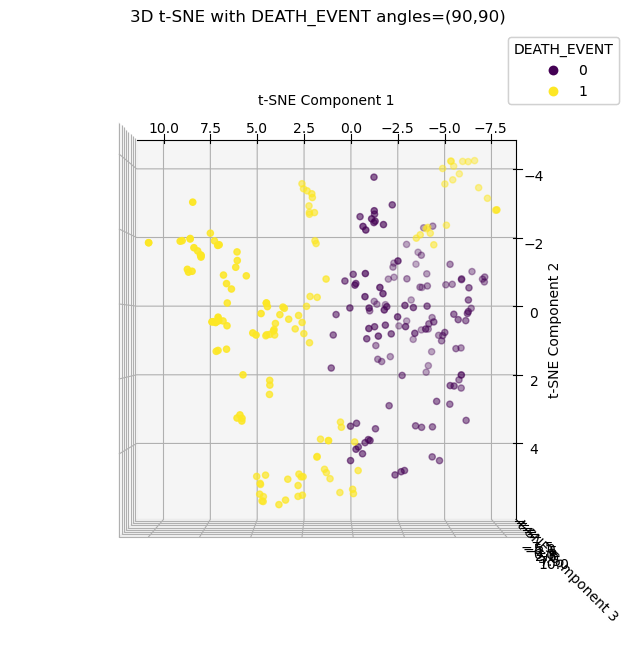

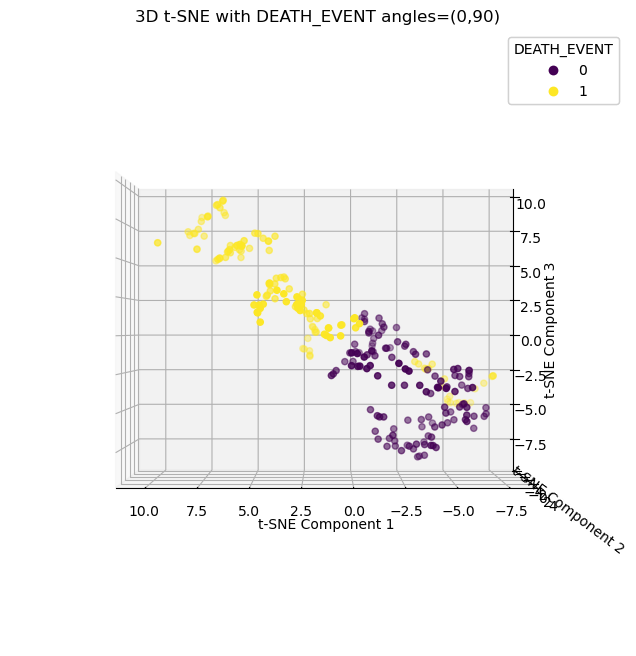

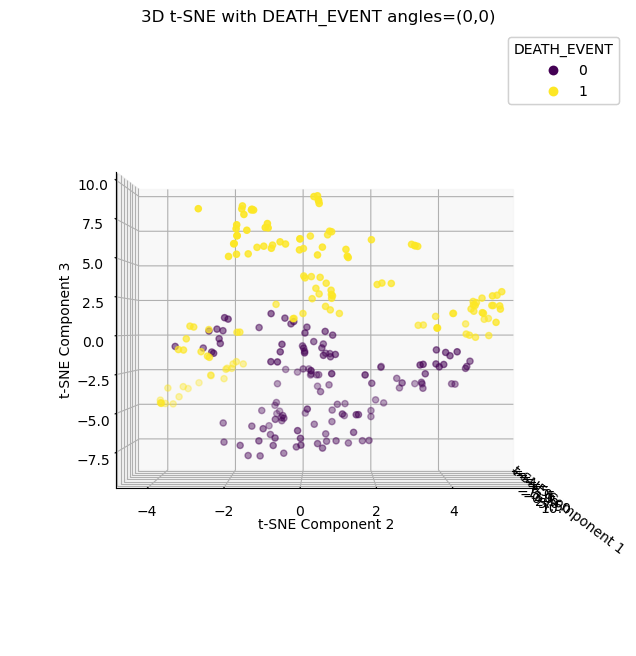

In [69]:
# Visualization using t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_values = tsne.fit_transform(combo_sampled_X)

plot_algo3d(tsne_values, combo_sampled_y, algo_name='t-SNE', target_name="DEATH_EVENT")

Seems like the purpled data points ***(DEATH_EVENT=0)*** are more densely packed compared to the yellow data points ***(DEATH_EVENT=1)***. This is likely to be an indication of similarity between the purple data points, while the yellow ones show greater variation.

It also looks like component 3 has successfully drawn a discrimination between the two groups of data points. Although there are some overlaps, the overall separation is palpable.

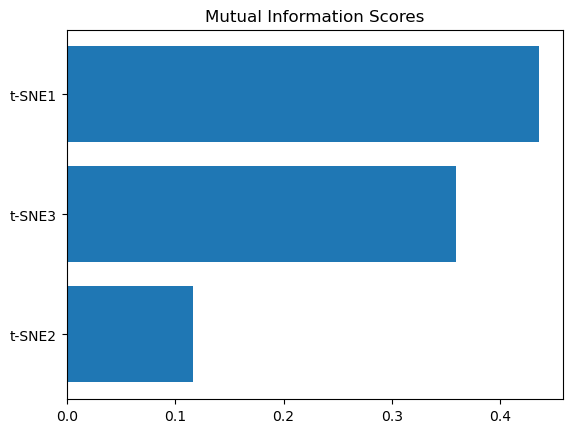

<Figure size 800x500 with 0 Axes>

In [70]:
component_names_tsne_3d = [f"t-SNE{i+1}" for i in range(tsne_values.shape[1])]
df_tsne_3d_structurized = pd.DataFrame(tsne_values, columns=component_names_tsne_3d)

mi_scores_tsne = make_mi_scores(df_tsne_3d_structurized, combo_sampled_y)

plot_mi_scores(mi_scores_tsne)

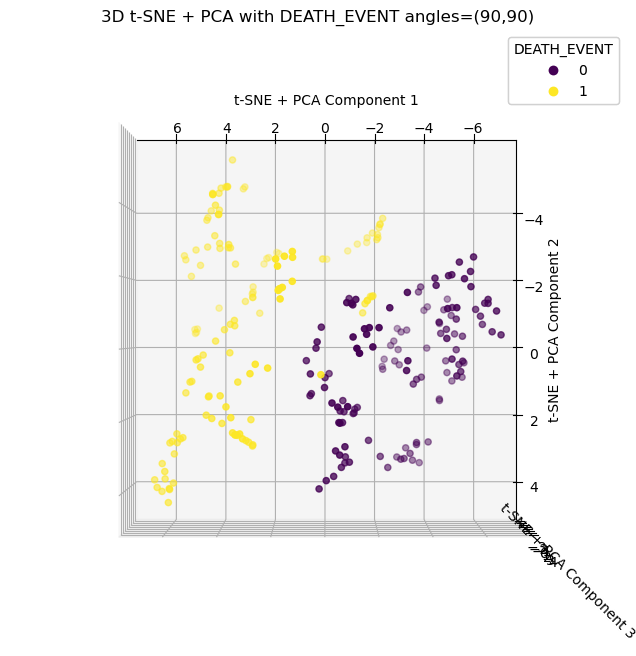

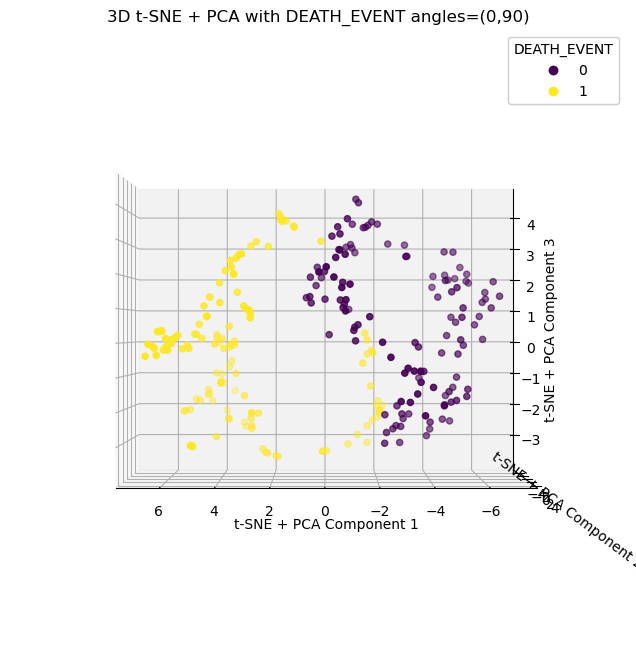

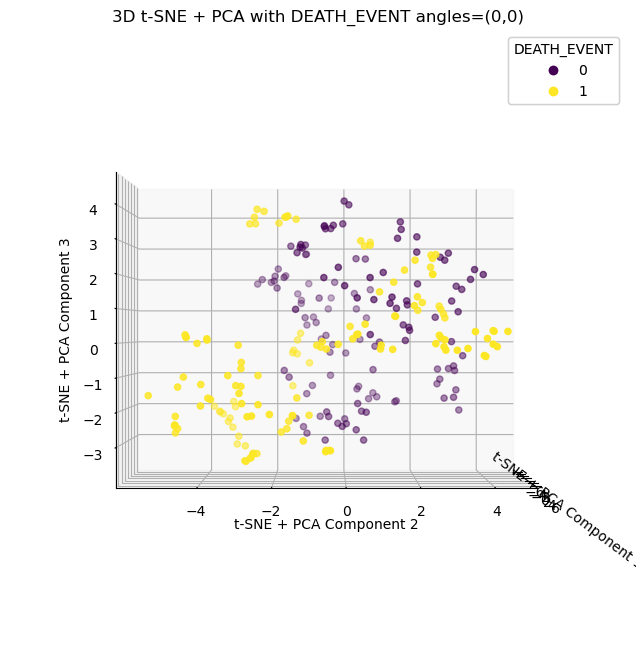

In [71]:
# Visualization using t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_values_pca = tsne.fit_transform(df_pca_3d_smoteenn)

plot_algo3d(tsne_values_pca, combo_sampled_y, 't-SNE + PCA', target_name='DEATH_EVENT')

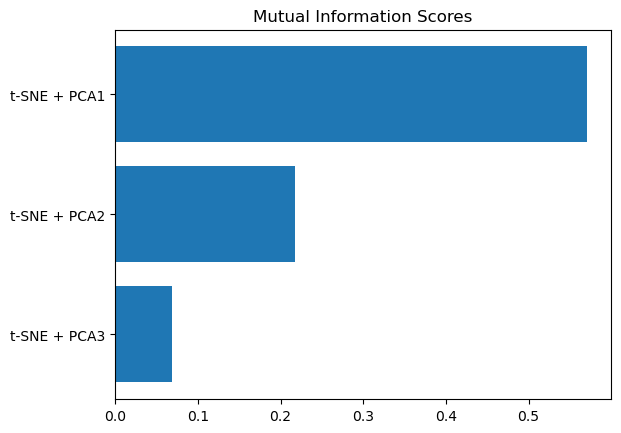

<Figure size 800x500 with 0 Axes>

In [72]:
component_names_tsne_pca_3d = [f"t-SNE + PCA{i+1}" for i in range(tsne_values_pca.shape[1])]
df_tsne_pca_3d_structurized = pd.DataFrame(tsne_values_pca, columns=component_names_tsne_pca_3d)

mi_scores_tsne_pca = make_mi_scores(df_tsne_pca_3d_structurized, combo_sampled_y)

plot_mi_scores(mi_scores_tsne_pca)

### Experiment (plotting best components of each DimRed)

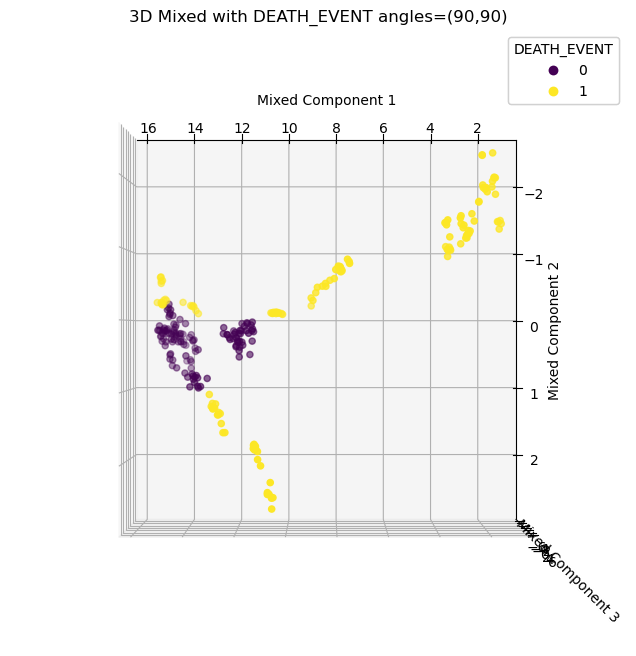

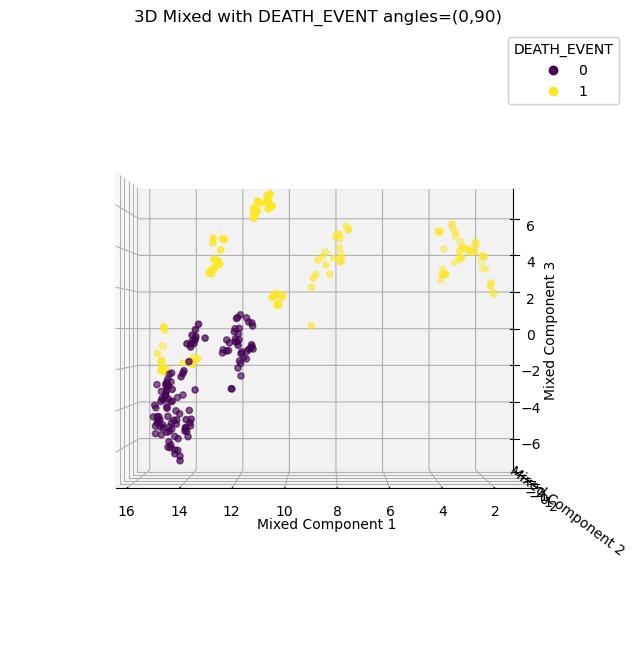

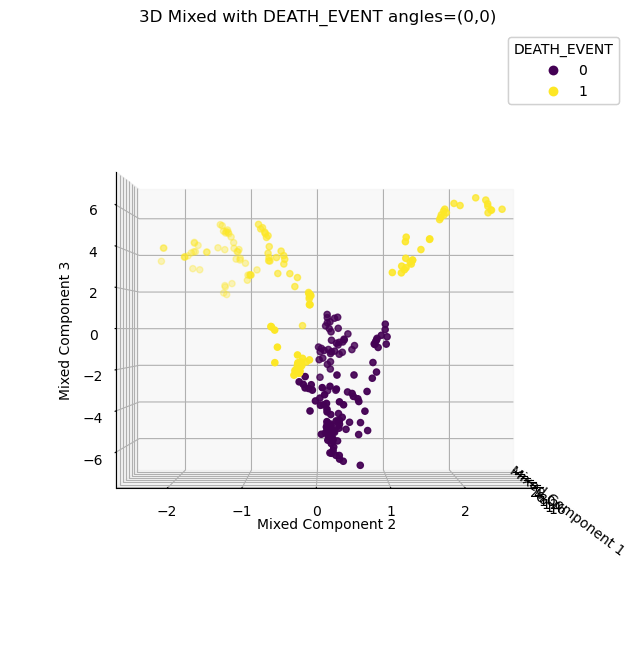

In [73]:
df_mixed_smoteenn = pd.DataFrame(
    {'UMAP': df_umap_3d_structurized_smoteenn.iloc[:, 0],
     'Isomap': df_isomap_smoteenn_3d_structurized.iloc[:, 0],
     't-SNE + PCA': df_tsne_pca_3d_structurized.iloc[:, 0]
                                  })

plot_algo3d(df_mixed_smoteenn.values, combo_sampled_y, algo_name='Mixed', target_name="DEATH_EVENT")

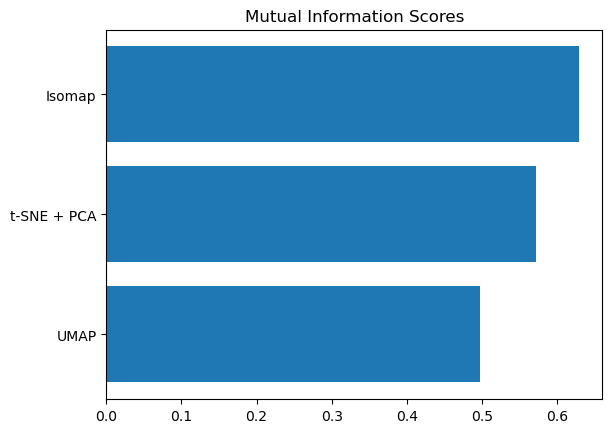

<Figure size 800x500 with 0 Axes>

In [74]:
mi_scores_mixed_smoteenn = make_mi_scores(df_mixed_smoteenn, combo_sampled_y)

plot_mi_scores(mi_scores_mixed_smoteenn)